# <span style="color:orange">Quality Data Analysis - Project Work </span>
## Team 1

### Course Details:
- Academic Year: 2024-2025

### Project Details:
- Title: Statistical Process Monitoring of Thermal Maps in Selective Laser Melting

### Team Members:
- Davide Chiecca
- Ginevra Carradori
- Linda Lovagnini
- Riccardo Caldara

### Instructors:
- Marco Luigi Giuseppe Grasso
- Matteo Bugatti

# PHASE 1 

# Introduction


Selective Laser Melting (SLM) is a powder bed fusion technique in additive manufacturing that enables the production of highly complex geometries. However, its intrinsic layer-wise nature and sensitivity to thermal fluctuations make it prone to process instabilities, such as local overheating or underheating, which may compromise part integrity and performance. To enhance process reliability, robust monitoring strategies capable of identifying such anomalies are essential.

This work proposes a Statistical Process Monitoring (SPM) framework designed to detect and spatially localize thermal anomalies within the SLM process. The framework is articulated into two main phases: (1) the development and tuning of the methodology on a reference dataset, and (2) its validation on a new dataset to assess robustness and generalization. The overarching goal is to detect local deviations in thermal behavior that may serve as early indicators of defect formation.

In Phase 1, the workflow involves the preprocessing of temperature data extracted from image-like layer representations, the computation of relevant pixel-level indicators, and the implementation of interpretable statistical models to flag abnormal process conditions. The proposed strategy comprises two complementary components:

- **Between-layer analysis.** For each layer, a multivariate Hotelling’s T² statistic is computed to summarize deviations in the overall thermal signature, derived from the pixel distribution of thermally significant regions. Monitoring the temporal evolution of this statistic across layers allows the identification of outliers and shifts potentially associated with process instabilities. Control limits and moving average schemes are applied to detect statistically significant deviations from nominal conditions.

- **Within-layer analysis.** To capture intra-layer heterogeneity, a clustering-based approach is employed. After standardizing the pixel-level temperature matrices and reducing dimensionality via Principal Component Analysis (PCA), a Hotelling’s T² value is assigned to each pixel, quantifying its extremity in the principal component space. These values are clustered using K-means ($K=2$), distinguishing between typical temperature regions and those with extreme thermal behavior. Two analytical strategies are then applied:

    (i) computation of the average temperature of extreme regions per layer, providing a global index of anomaly intensity; spatial partitioning of each layer into nine areas, with localized averages computed to enable fine-grained anomaly localization. This dual perspective supports both high-level monitoring and actionable spatial diagnostics.
    
    (ii) spatial partitioning of each layer into 100 areas and computation of measures of hot and cold points proximity.

To ground the methodology, relevant literature on statistical monitoring for additive manufacturing, thermal image analysis, and spatial anomaly detection is reviewed. While existing approaches demonstrate the potential of thermal signals in quality assessment, they often suffer from limited spatial interpretability or heavy reliance on black-box models. The proposed framework addresses these limitations by integrating statistical transparency with spatial granularity, delivering a monitoring solution that is both interpretable and operationally effective.

Phase 2 of the study will apply the designed methodology to an independent dataset to validate its diagnostic capabilities and assess its adaptability to varying process conditions.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import qdatoolkit as qda
from sklearn.decomposition import PCA
import scipy.stats as stats
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from scipy.stats import boxcox, normaltest
from matplotlib.patches import Ellipse
from scipy.stats import chi2
from scipy.stats import f

All layer data is appended into a single dataframe 'stacked_data.csv'. 
The code to create the dataframe is reported in the following lines.

In [ ]:
import glob
import os

def read_all_csv_files(folder_path):
    # Get all CSV file paths in the folder
    csv_files = glob.glob(os.path.join(folder_path, "*.csv"))
    
    # Read each CSV file and store them in a list of DataFrames
    dataframes = [pd.read_csv(file) for file in csv_files]
    return dataframes
    
# The folder data contains the 25 datasets related to the different layers
folder_path = "./data"
all_data = read_all_csv_files(folder_path)
stacked_data = pd.concat(all_data, ignore_index=True)
stacked_data.to_csv(os.path.join(folder_path, "stacked_data.csv"), index=False)

In [ ]:
file_path = "./data/stacked_data.csv"
df = pd.read_csv(file_path)

df.head()
df.shape

(4512006, 12)

# Assumptions and preliminary data analysis

Initial data exploration involves visualizing the temporal evolution of temperature within each layer. This preliminary step reveals anomalous patterns, specifically identifying data points situated outside the physical boundaries of the laser-fabricated component.

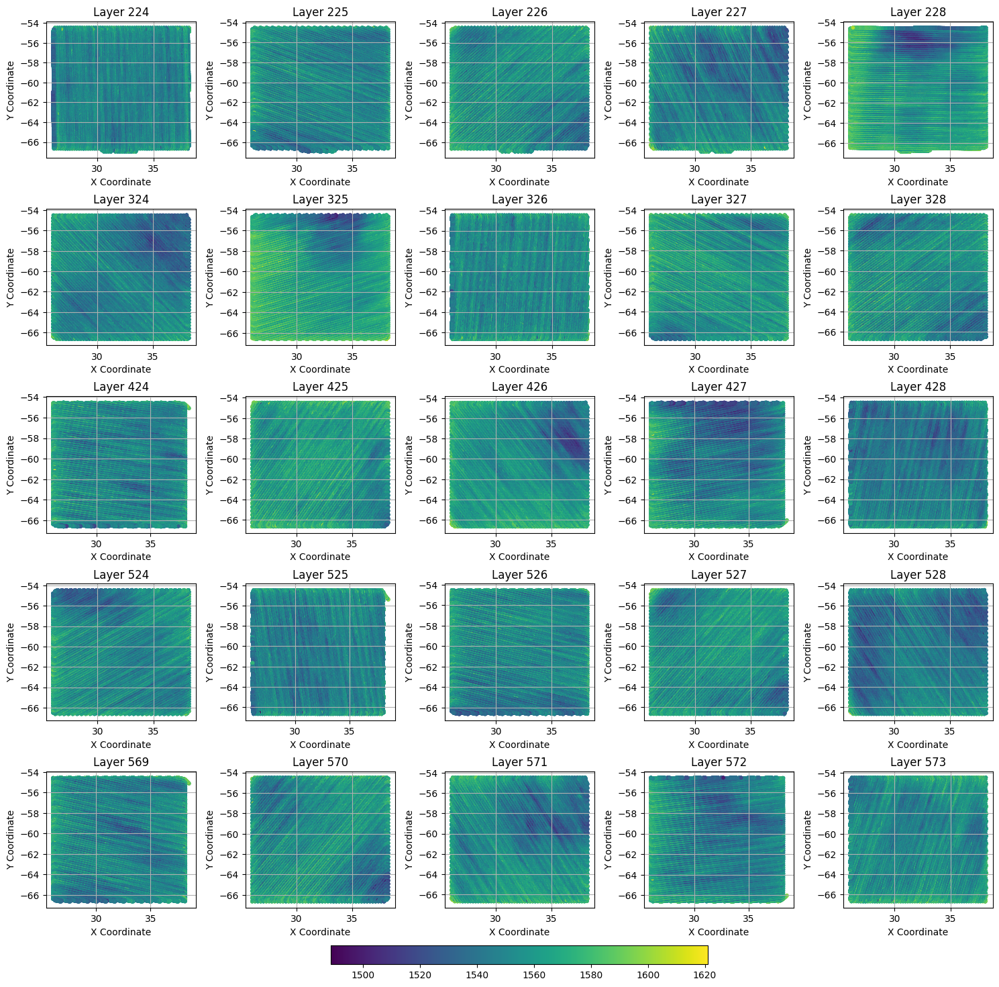

In [3]:
# Get unique layer IDs
unique_layer_ids = df['layer_id'].unique()

# Create a single figure with a 5x5 grid of subplots
fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()  # Flatten the 2D array of axes for easier iteration

# Plot each layer_id in a subplot
for i, layer_id in enumerate(unique_layer_ids):
    layer_data = df[df['layer_id'] == layer_id]
    scatter = axes[i].scatter(layer_data['x'], layer_data['y'], c=layer_data['temp'], cmap='viridis', s=10)
    axes[i].set_title(f'Layer {layer_id}')
    axes[i].set_xlabel('X Coordinate')
    axes[i].set_ylabel('Y Coordinate')
    axes[i].grid(True)

plt.tight_layout()
plt.colorbar(scatter, ax=axes, orientation='horizontal', fraction=0.02, pad=0.04)
plt.show()

> Data visualization: path of the temperature on the space created by the variables x,y for each of the 25 layers.

Subsequently, the assessement of the underlying data assumptions by examining a randomly selected single layer is realized. This analysis indicates a significant autocorrelation between individual data points and their preceding lags. This strong temporal dependence is consistently observed across all layers, a phenomenon anticipated given the microsecond sampling frequency. Furthermore, the temperature data does not conform to a normal distribution.

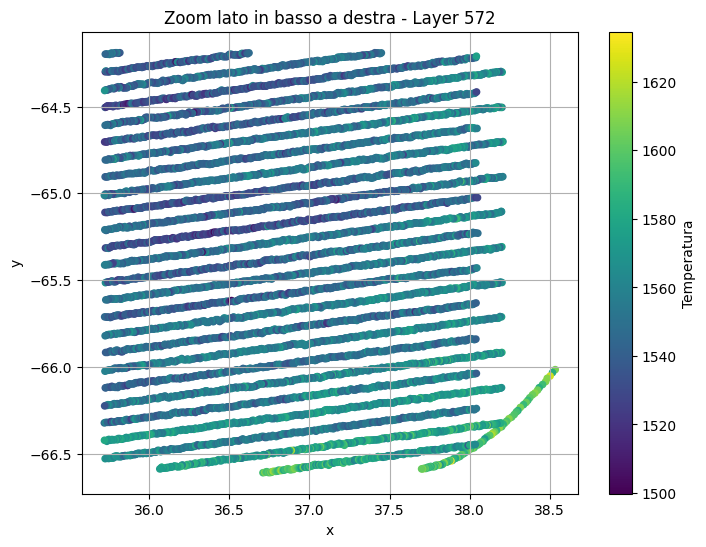

In [4]:
# Filter data for layer 572
layer_572 = df[df['layer_id'] == 572]

# Determine the limits for zooming (bottom right)
# Consider the 20% of the lower y values and the 20% of the upper x values
x_min_zoom = layer_572['x'].quantile(0.8)
y_max_zoom = layer_572['y'].quantile(0.2)

zoom_data_572 = layer_572[(layer_572['x'] >= x_min_zoom) & (layer_572['y'] <= y_max_zoom)]

plt.figure(figsize=(8, 6))
sc2 = plt.scatter(zoom_data_572['x'], zoom_data_572['y'], c=zoom_data_572['temp'], cmap='viridis', s=20)
plt.colorbar(sc2, label='Temperatura')
plt.title('Zoom lato in basso a destra - Layer 572')
plt.xlabel('x')
plt.ylabel('y')
plt.grid(True)
plt.show()

> This chart is a zoom that regards the path of the temperature on the space created by the variables $x,y$ for the layer_id 572, with a specific zoom on the area at the bottom-right part of the space created. The picture helps realizing that the laser collected also data outside the component, leading to a distortion of the dataset.

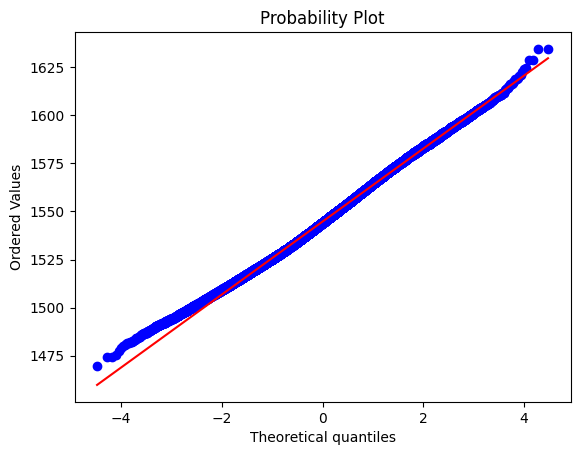

c:\Users\Utente\Documents\PYTHON\envs\qda\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Shapiro-wilk test statistic = 0.997
Shapiro-wilk test p-value = 0.000
Runs test statistic = -266.129
Runs test p-value = 0.000



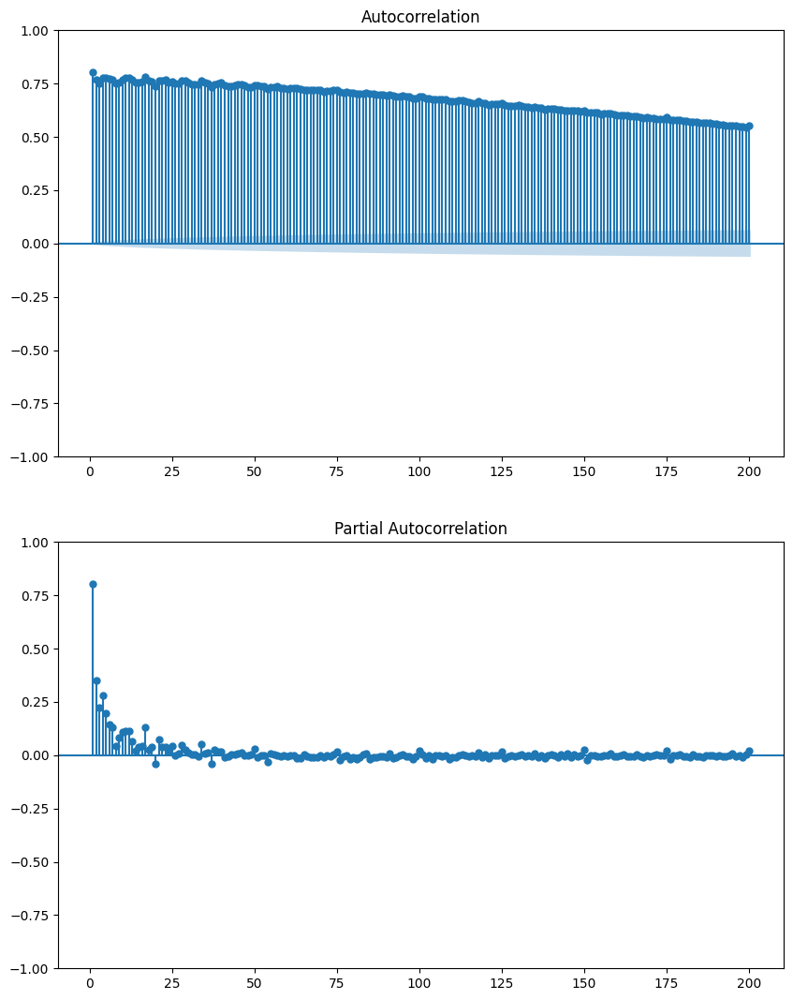

In [5]:
_ = qda.Assumptions(layer_572['temp']).normality()
_ = qda.Assumptions(layer_572['temp']).independence()

> The temperature in the layers is not normal. The ACF shows linear decay meaning non-stationarity in the process.

Then, the check of the variation of the temperature inside a specific layer is represented to understand how temperatures are distributed.

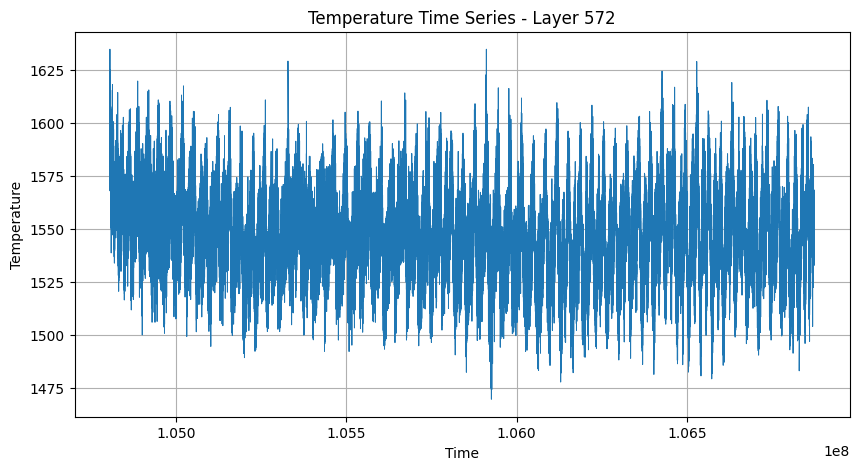

In [6]:
# Filter data for layer 572
layer_572 = df[df['layer_id'] == 572]

# Plot the temperature time series for layer 572
plt.figure(figsize=(10, 5))
plt.plot(layer_572['t'], layer_572['temp'], linewidth=0.7)
plt.title('Temperature Time Series - Layer 572')
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.grid(True)
plt.show()

To mitigate the influence of data points collected at the layer boundaries, a cropping procedure is implemented for each layer. This is deemed necessary due to the varying spatial dimensions across layers and the inclusion of measurements outside the intended physical component, which can introduce distortions. 

To minimize the loss of information the size of the useful region is maximized through the following process:
- A composite plot is generated by overlapping the 25 individual layers to identify regions characterized by minimal point density.
- The plot illustrates the spatial distribution of normalized point densities across all layers, with increased darkness indicating a higher degree of inter-layer overlap.
- Regions with low point density, defined as areas containing data from only a single layer, are excluded from the analysis.

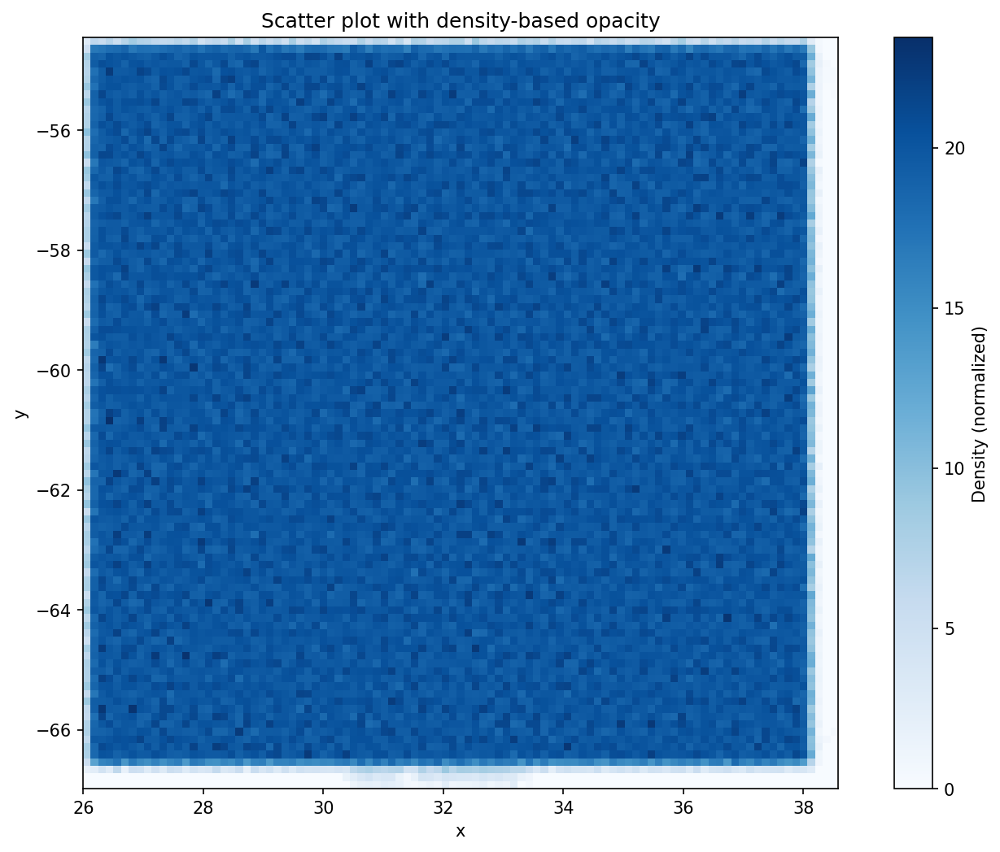

In [7]:
# Create a 2D histogram to calculate density
plt.figure(figsize=(12, 8), dpi=150)

# Combine all data points into a single array from all layers
all_points = df[['x', 'y']].values  # Extract x and y columns from the entire dataset

# Create a 2D histogram
x_bins = np.linspace(all_points[:, 0].min(), all_points[:, 0].max(), 100)
y_bins = np.linspace(all_points[:, 1].min(), all_points[:, 1].max(), 100)
hist, x_edges, y_edges = np.histogram2d(all_points[:, 0], all_points[:, 1], bins=[x_bins, y_bins])

# Normalize the histogram to get opacity values
# Use the number of unique layers (layer_id) for normalization
num_layers = df['layer_id'].nunique()
hist_normalized = hist / num_layers

# Plot the histogram as an image
plt.imshow(hist_normalized.T, extent=[x_bins[0], x_bins[-1], y_bins[0], y_bins[-1]],
           origin='lower', cmap='Blues', alpha=1)

plt.title('Scatter plot with density-based opacity')
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar(label='Density (normalized)')
plt.show()

In [8]:
# Count the occurrences of each point across layers
point_counts = {}
for _, row in df.iterrows():
	point = (row['x'], row['y'])
	if point in point_counts:
		point_counts[point] += 1
	else:
		point_counts[point] = 1

#Filter the points that are present in at least 4 layers
point_counts_array = np.array(list(point_counts.values()))
filtered_points = np.array([point for point, count in point_counts.items() if count >= 4])

# Check if filtered_points is not empty before calculating min and max values
if filtered_points.size > 0:
	filtered_points = np.array(filtered_points)  # Ensure it's a numpy array
	x_min = filtered_points[:, 0].min()
	x_max = filtered_points[:, 0].max()
	y_min = filtered_points[:, 1].min()
	y_max = filtered_points[:, 1].max()

	print(f"x_min: {x_min}, x_max: {x_max}")
	print(f"y_min: {y_min}, y_max: {y_max}")
else:
	print("No points found with count 4= 2.")


x_min: 26.264, x_max: 38.053
y_min: -66.506, y_max: -54.848


The region found has the following boundaries:

$
x_{\text{range}} = (26.264,\ 38.053) \\
y_{\text{range}} = (-66.506,\ -54.848)
$


During the cropping process, challenges arise due to the different inclinations of track_ids across layers. This results in the potential loss of data points at the boundaries of the cropped rectangular regions in certain instances. To address this, missing values within the resulting 2D temperature matrix are imputed using a two-step interpolation process: first vertically (along columns) and then horizontally (across rows). This approach aimes to generate a more complete grid of temperature values.

The rationale for employing bidirectional interpolation is rooted in the inherent spatial continuity of temperature data. This method avoids the potential biases or artifacts associated with simply discarding or zero-filling missing values. 

While interpolation can potentially smooth genuine variations or obscure outliers, it is important to note that the original data in each layer also contained missing points due to the aforementioned track_id inclination. Consequently, the distortion introduced by interpolation was considered to be primarily related to the smoothing of variations rather than the artificial creation of data.

Following the cropping stage, a consistent spatial grid is established across all layers. This step is crucial for enabling direct comparisons between corresponding regions in different layers. Initial attempts to utilize the original $x,y$ coordinates as a common reference system proves unsuccessful due to misalignment between layers. Therefore, the creation of a standardized grid becomes necessary to ensure spatial consistency.

In [9]:
# Create temperature grid and then crop it
def generate_temperature_matrices_v1(df, layer_ids, x_range, y_range, digits_round=1):
    temperature_matrices = []
    for layer_id in layer_ids:
        layer_df = df[df['layer_id'] == layer_id]

        #layer_df['x_bin'] = layer_df['x'].round(digits_round)
        #layer_df['y_bin'] = layer_df['y'].round(digits_round)
        layer_df['x_bin'] = np.floor(layer_df['x'] * (10 ** digits_round)) / (10 ** digits_round)
        layer_df['y_bin'] = np.floor(layer_df['y'] * (10 ** digits_round)) / (10 ** digits_round)

        # Create a pivot table with the grouped x and y values with mean
        temperature_matrix = layer_df.pivot_table(index='y_bin', columns='x_bin', values='temp', aggfunc='median')
        
        # Fill missing values with interpolation
        temperature_matrix = temperature_matrix.interpolate(axis=0).interpolate(axis=1)
        
        # Crop the temperature matrix based on the x_range and y_range
        cropped_matrix = temperature_matrix.loc[y_range[0]:y_range[1], x_range[0]:x_range[1]]
        temperature_matrices.append(cropped_matrix.to_numpy())
    return np.array(temperature_matrices)

In [10]:
digits_round = 1
x_range = (26.264, 38.053)
y_range = (-66.506, -54.848)
layer_ids = [224, 225, 226, 227, 228, 324, 325, 326, 327, 328, 424, 425, 426, 427, 428, 524, 525, 526, 527, 528, 569, 570, 571, 572, 573]
list_25l = generate_temperature_matrices_v1(df, layer_ids, x_range, y_range, digits_round)

C:\Users\Utente\AppData\Local\Temp\ipykernel_9908\2349296598.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  layer_df['x_bin'] = np.floor(layer_df['x'] * (10 ** digits_round)) / (10 ** digits_round)
C:\Users\Utente\AppData\Local\Temp\ipykernel_9908\2349296598.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  layer_df['y_bin'] = np.floor(layer_df['y'] * (10 ** digits_round)) / (10 ** digits_round)


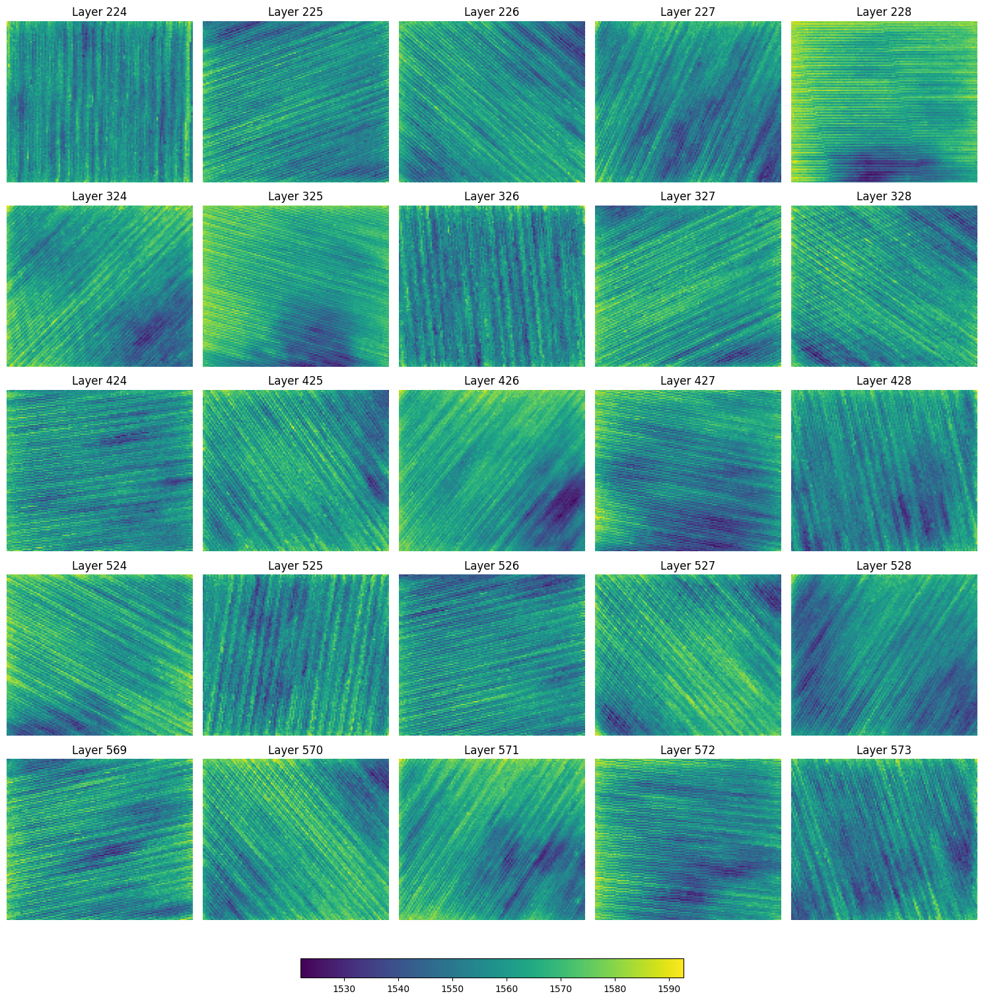

In [11]:
fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for i, layer in enumerate(list_25l):
    im = axes[i].imshow(layer, aspect='auto', cmap='viridis')
    axes[i].set_title(f'Layer {layer_ids[i]}')
    axes[i].axis('off')

plt.tight_layout()
plt.colorbar(im, ax=axes, orientation='horizontal', fraction=0.02, pad=0.04)
plt.show()

> Layers after cropping and resampling into the grid

# Proposed methodology

Two PCA unfolding strategies for reducing the high sampled data are implemented and evaluated:

## 1. Between-layer analysis
Objective: detect anomalous change in temperature of one layer compared to other layers. Anomalies can be caused by hardware issues, spatter bursts, etc.

Given $L$ the list of temperature matrices each with shape $(M, N)$ where, in our application, $M=N=120$, $L$ has shape $(25, 120, 120)$:
- Each layer is vectorized and treated as a row of size 120*120 = 14400
- PCA input matrix X ∈ ℝ(25 × 14400) where rows = layers, columns = pixels.
- PCA is applied across the 25 layers, with each pixel treated as a variable.
- Hotelling’s T² statistic is computed per layer
- Multiple control charts are used to flag anomalous layers.

In [12]:
# Assume list_25l is a NumPy array of shape (25, 120, 120)
frames = np.array(list_25l)
frames = (frames - np.mean(frames, axis=(1, 2), keepdims=True)) / np.std(frames, axis=(1, 2), keepdims=True)
J, M, N = frames.shape
p = M * N


# Step 1: Reshape each frame to 1D vector and stack them
X = frames.reshape(J, -1)  # Shape: (J, p)

# Step 2: Apply PCA
pca = PCA()
scores = pca.fit_transform(X)

# Step 3: Choose m components explaining ≥60% of variance
explained = np.cumsum(pca.explained_variance_ratio_)
m = np.searchsorted(explained, 0.59) + 1
print(m)
Z = scores[:, :m]
Lambda_inv = np.diag(1 / pca.explained_variance_[:m])

# Step 4: Compute T² for each frame (row-wise)
T2_frame = np.sum(Z @ Lambda_inv * Z, axis=1)  # Shape: (J,)
print(T2_frame)

9
[19.32746589 13.35381094  4.45076314  4.96668393  4.54358712  4.69633698
  4.71492299 16.89662405  7.89387186  4.43141561 14.25044172  7.42359229
  4.81307791  3.53839001  7.19820746  5.62890159 13.9320047  18.18164074
  5.25952847 11.04835794 17.55342887  5.97247603  4.06890891  5.15994815
  6.69561268]


In [13]:
print("Variance explained by each principal component:")
print(pca.explained_variance_ratio_)
print("Cumulative variance explained by principal components:")
print(explained)

Variance explained by each principal component:
[1.63914182e-01 8.66735248e-02 8.26752849e-02 6.18795011e-02
 4.43379199e-02 4.30814531e-02 4.03827038e-02 3.87171128e-02
 3.82997552e-02 3.64229931e-02 3.46993784e-02 3.29891157e-02
 3.15899764e-02 3.05731565e-02 2.95176818e-02 2.88816250e-02
 2.74028731e-02 2.62064929e-02 2.53629871e-02 2.21734495e-02
 2.18287728e-02 2.03364268e-02 1.72499678e-02 1.48036657e-02
 2.80574300e-32]
Cumulative variance explained by principal components:
[0.16391418 0.25058771 0.33326299 0.39514249 0.43948041 0.48256187
 0.52294457 0.56166168 0.59996144 0.63638443 0.67108381 0.70407292
 0.7356629  0.76623606 0.79575374 0.82463536 0.85203824 0.87824473
 0.90360772 0.92578117 0.94760994 0.96794637 0.98519633 1.
 1.        ]


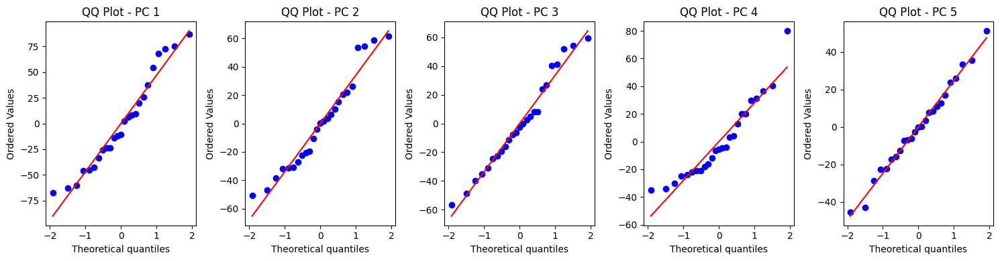

In [14]:
# Z contains the scores (projections) of each frame onto the first m principal components
# Assume you already have: Z = scores[:, :m]

# Choose how many PCs to inspect
num_pcs_to_check = min(5, Z.shape[1])  # Let's check the first 5 PCs (or fewer if m < 5)

fig, axs = plt.subplots(1, num_pcs_to_check, figsize=(15, 4))

for i in range(num_pcs_to_check):
    stats.probplot(Z[:, i], dist="norm", plot=axs[i])
    axs[i].set_title(f'QQ Plot - PC {i+1}')

plt.tight_layout()
plt.show()


> The data can be accepted as normal.

Processing PC 1
Runs test statistic = 1.441
Runs test p-value = 0.150



c:\Users\Utente\Documents\PYTHON\envs\qda\lib\site-packages\qdatoolkit\models.py:731: UserWarning: A numpy array was passed to the Assumptions class and converted to Pandas Series.
Note that all other methods in qda-toolkit only accept Pandas Series or Pandas Dataframe.
  warnings.warn(


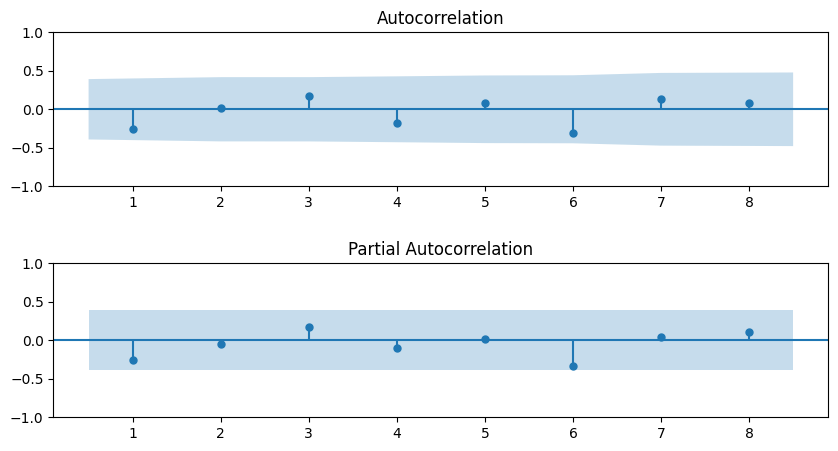

Processing PC 2
Runs test statistic = 1.441
Runs test p-value = 0.150



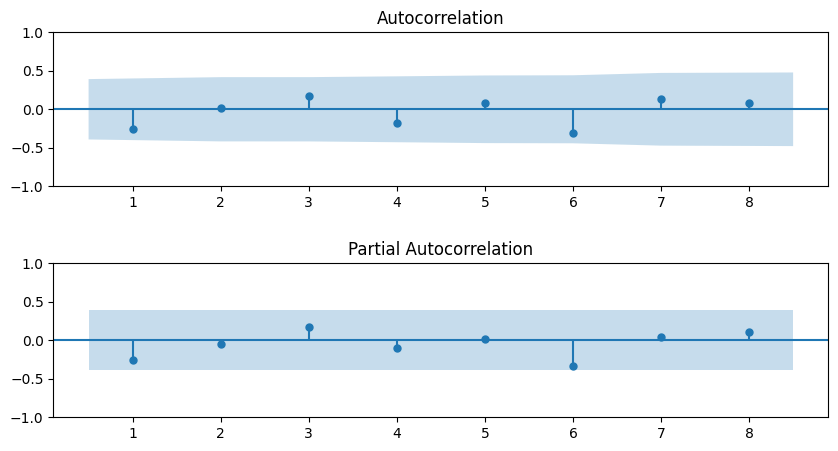

Processing PC 3
Runs test statistic = 1.441
Runs test p-value = 0.150



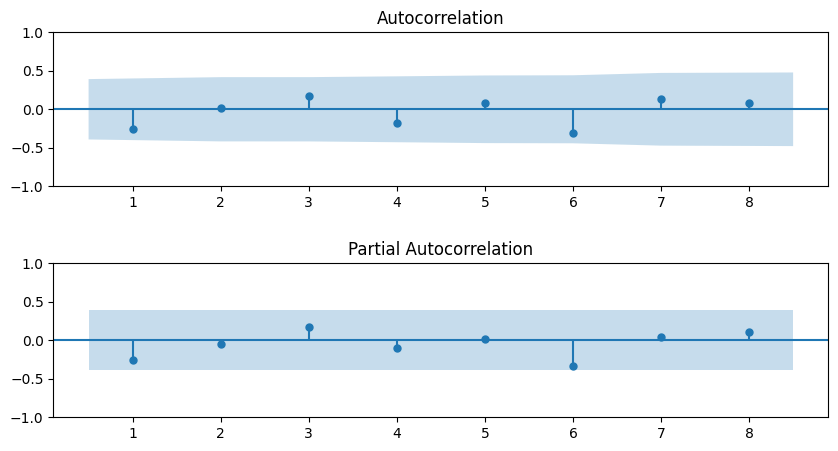

Processing PC 4
Runs test statistic = 1.441
Runs test p-value = 0.150



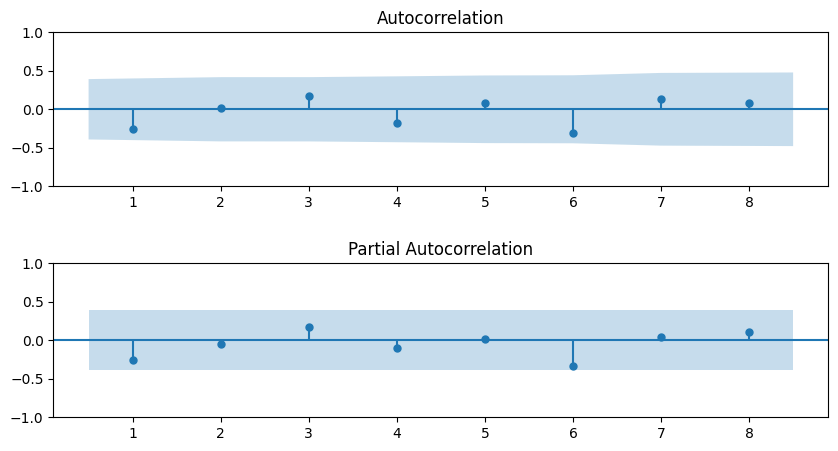

Processing PC 5
Runs test statistic = 1.441
Runs test p-value = 0.150



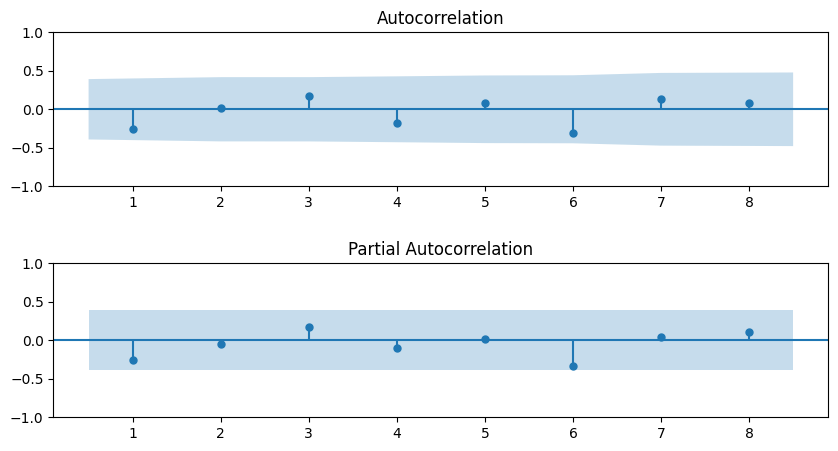

In [15]:
for i in range(5):
    print(f"Processing PC {i+1}")
    runs_statistic, runs_pvalue = qda.Assumptions(Z[:,1]).independence()

> Autocorrelation is tested on all principal component scores (5 shown for brevity). ACF, PACF, and runs test confirm independence post-PCA.

Three methodologies for creating control charts are explored in the "Results" section:
* I-MR Charts of the first $m$ principal components
* Control chart for small shifts
* Hotelling $T^2$ Time series and ellipse Control Chart

## 2. Within-layer analysis


Objective: identify points with anomalous temperature behavior in each layer.

The approach relies on clustering temperature data via PCA and K-means (K=2), yielding two groups: 
    1. Extreme temperatures cluster
    2. Typical temperatures cluster
These clusters serve as the basis for subsequent statistical process monitoring.

NOTE: Clustering is only a preliminary step and not the method used to detect anomalies.

### Clustering methodology
In order to assign each pixel to a cluster the following methodology is applied:
- Given $L$ the list of temperature matrices each with shape $(M, N)$ where, in our application, $M=N=120$, $L$ has shape $(25, 120, 120)$.
- Standardization before PCA: compulsory since the variables had different scales.
- Data is reshaped so each row represents a pixel; PCA is then applied.
- Computation of the Hotelling’s T² statistic for each pixel, measuring how extreme each pixel is in the principal component space.
- A pixel with high Hotelling’s T² lies far from the PCA center and is marked as extreme, indicating anomalous thermal behavior.
- K-means clustering ($K = 2$) is applied to T² values, separating typical and extreme pixels. Since T² may be skewed, standardization is required to avoid biased clustering due to scale.

In [16]:
num_layers = list_25l.shape[0]
height = list_25l.shape[1]
width = list_25l.shape[2]
smallest_cluster_pixels = []
biggest_cluster_pixels = []

for i in range(num_layers):
    # Extract the current layer
    current_layer = list_25l[i, :, :]

    # Standardize the data before reshaping for PCA
    scaler_pca = StandardScaler()
    current_layer_scaled = scaler_pca.fit_transform(current_layer)

    # Reshape the standardized data for PCA
    X = current_layer_scaled.reshape(-1, 1)

    # Apply PCA
    pca = PCA(n_components=1)
    scores = pca.fit_transform(X)

    # Compute Hotelling’s T² statistic for each pixel
    explained_variance = pca.explained_variance_
    if explained_variance[0] > 1e-8:
        T2 = (scores ** 2) / explained_variance[0]
    else:
        T2 = np.zeros_like(scores)

    # Standardize T2 values before K-means
    scaler_kmeans = StandardScaler()
    T2_scaled = scaler_kmeans.fit_transform(T2.reshape(-1, 1))

    # Apply K-means clustering on the T² map
    kmeans = KMeans(n_clusters=2, n_init=10, random_state=42)
    clusters_flat = kmeans.fit_predict(T2_scaled)
    clusters_map = clusters_flat.reshape(height, width)

    # Calculate the size of each cluster
    unique_clusters, counts = np.unique(clusters_map, return_counts=True)
    cluster_sizes = dict(zip(unique_clusters, counts))

    # Find the label of the smallest and biggest cluster
    smallest_cluster_label = min(cluster_sizes, key=cluster_sizes.get)
    biggest_cluster_label = max(cluster_sizes, key=cluster_sizes.get)

    # Extract the pixel coordinates and values for the smallest cluster
    smallest_cluster_indices = np.where(clusters_map == smallest_cluster_label)
    smallest_cluster_coords = list(zip(smallest_cluster_indices[0], smallest_cluster_indices[1]))
    smallest_cluster_values = current_layer_scaled[smallest_cluster_indices]
    smallest_cluster_pixels.append({
        "layer": i + 1,
        "cluster_label": smallest_cluster_label,
        "pixel_coordinates": smallest_cluster_coords,
        "pixel_values": smallest_cluster_values
    })

    # Extract the pixel coordinates and values for the biggest cluster
    biggest_cluster_indices = np.where(clusters_map == biggest_cluster_label)
    biggest_cluster_coords = list(zip(biggest_cluster_indices[0], biggest_cluster_indices[1]))
    biggest_cluster_values = current_layer_scaled[biggest_cluster_indices]
    biggest_cluster_pixels.append({
        "layer": i + 1,
        "cluster_label": biggest_cluster_label,
        "pixel_coordinates": biggest_cluster_coords,
        "pixel_values": biggest_cluster_values
    })

Given the clustering methodology employed, specifically utilizing Hotelling's T² statistic, the "Smallest Cluster" identified inherently represents the group exhibiting the most statistically anomalous multivariate observations. While a standardized analytical approach might prioritize the cluster with the highest average T² value, for the sake of computational ease and to facilitate a focused in-depth analysis of the most deviating data points, the "Smallest Cluster" is selected for further investigation.

## 2.1 Extreme temperatures cluster analysis
The "Smallest Cluster" is then matched with the original data list to give to each pixel the $(x,y)$ coordinates and to specify the layer_id.

In [17]:
# Iterate through each layer's smallest cluster data
data = []
for layer_data in smallest_cluster_pixels:
    layer_id = layer_data['layer']
    pixel_coordinates = layer_data['pixel_coordinates']
    pixel_values = layer_data['pixel_values']
    
    # Add each pixel's data to the list
    for (y, x), temp_std in zip(pixel_coordinates, pixel_values):
        data.append({'x': x, 'y': y, 'temp_std': temp_std, 'layer_id': layer_id})

# Create a DataFrame from the list
high_T2_cluster = pd.DataFrame(data)
high_T2_cluster.head()

,x,y,temp_std,layer_id
0,0,0,2.732935,1
1,2,0,2.486629,1
2,4,0,2.301647,1
3,6,0,3.156023,1
4,7,0,1.891568,1


A chart is drawn to see how the extreme pixels with anomalous temperature behavior are distributed.

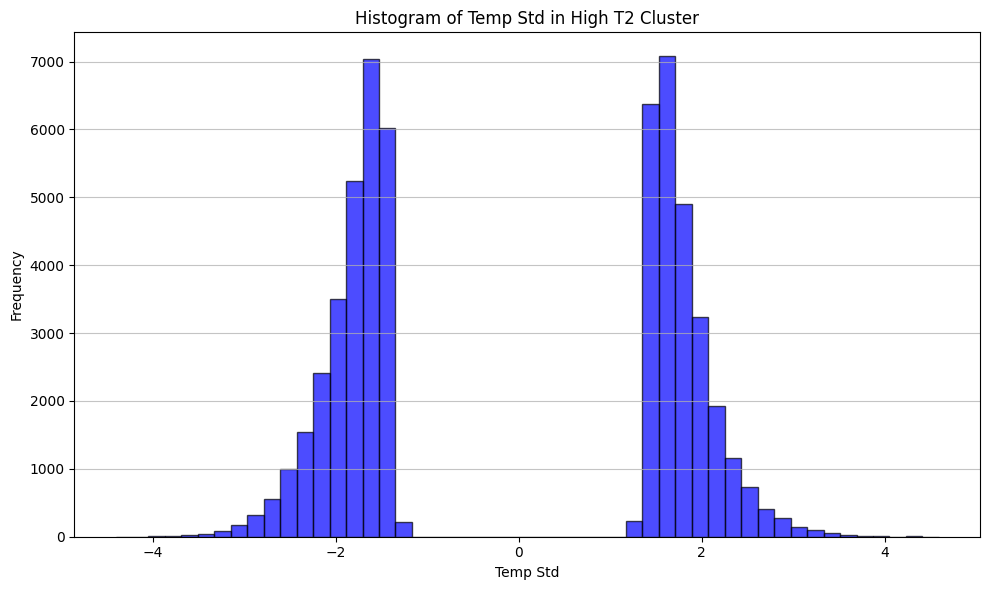

In [18]:
# Create a histogram of 'temp_std'
plt.figure(figsize=(10, 6))
plt.hist(high_T2_cluster['temp_std'], bins=50, color='blue', alpha=0.7, edgecolor='black')
plt.xlabel('Temp Std')
plt.ylabel('Frequency')
plt.title('Histogram of Temp Std in High T2 Cluster')
plt.grid(axis='y', alpha=0.75)
plt.tight_layout()
plt.show()

>The plot shows a bimodal distribution of standardized temperatures, indicating two distinct groups: cold and hot spots. A threshold at Temp Std = 0 naturally separates them.

In [19]:
# Separate into cold_spots and hot_spots based on temp_std threshold
cold_spots = high_T2_cluster[high_T2_cluster['temp_std'] < 0].copy()
hot_spots = high_T2_cluster[high_T2_cluster['temp_std'] >= 0].copy()

# Reset indices for both DataFrames
cold_spots.reset_index(drop=True, inplace=True)
hot_spots.reset_index(drop=True, inplace=True)

### 2.1.1 Methodology for investigating the Temperatures of Cold and Hot Spots
Overall goal: discern anomalies in hot and cold spot characteristics across different layers

Two approaches are adopted: a "quick and dirty" method and a more detailed one. 
The procedure is first described for cold spots, then applied identically to hot spots.

#### Analysis:
Objective: calculate the mean cold spot temperature for each layer, yielding a vector of 25 values representing the average cold spot intensity per layer. 

Process followed:
- Application of Box-Cox transformation
- Computation of the mean of the cold spots temperatures in each layer
- Normality and independence assumptions are tested on the mean temperature dataframe.

Pro: computational efficiency and ease of interpretation. 

Cons: 
- Averaging within a layer may obscure outliers and hide relevant intra-layer variability, limiting the method's reliability.
- Indication of an anomaly at the layer level, lacking of spatial specificity

#### Approach extension (9x9 grid):
Objective: investigating cold spots within various regions across the different layers.

To simplify, the layer is divided into 9 areas, though finer granularity can be achieved by increasing the number of regions.

Process followed:
- Split each layer in 9 areas on the $x,$y space with a comparable numerosity of data
- Box-Cox transformed temperatures are averaged per area and layer, then stored in a 9×25 dataframe
- Definition of an 1D array with all the mean values, getting rid of eventual Not a Number points
- Check of the normality and indipendence assumptions on the 1D array

Pros of the second approach compared to the first one:
- Considering the means of each region enhance the visibility of specific anomalies
- Improved investigability: the detection of an outlier allows the machine operator to readily identify the specific area and layer contributing to the data anomaly




Note: Regular points were treated differently. The approach can be found below in paragraph 2.2.

#### Cold Spots Analysis

To study cold spots, an initial plot is created. Normality and independence are then tested to enable control chart design.

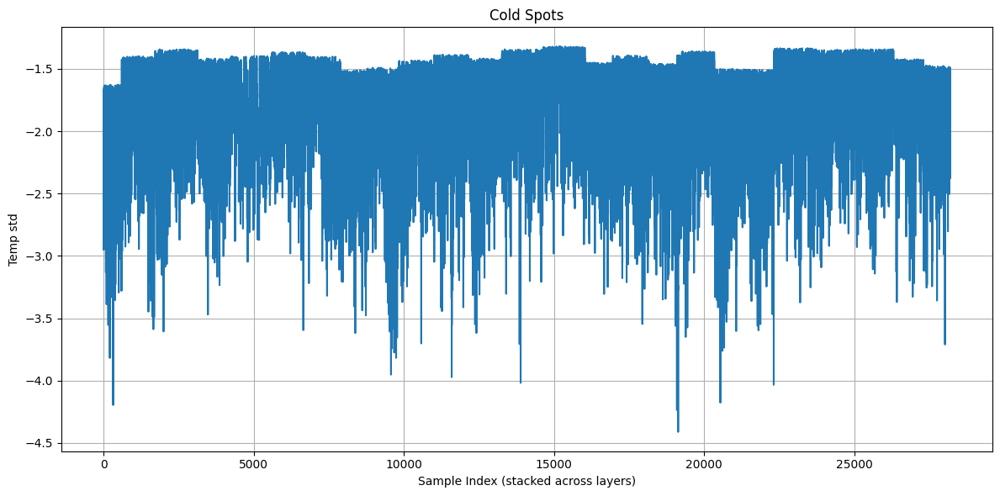

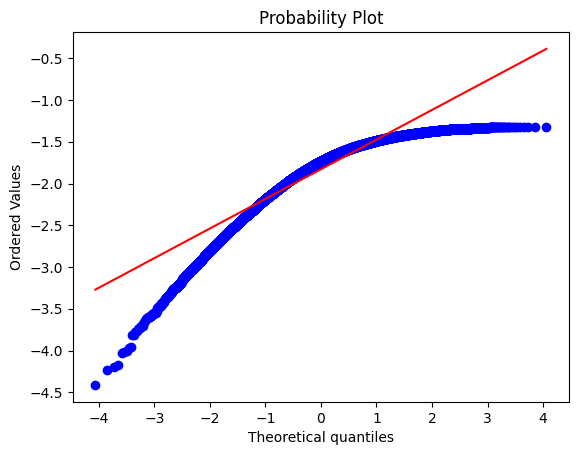

c:\Users\Utente\Documents\PYTHON\envs\qda\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Shapiro-wilk test statistic = 0.897
Shapiro-wilk test p-value = 0.000
Runs test statistic = -36.395
Runs test p-value = 0.000



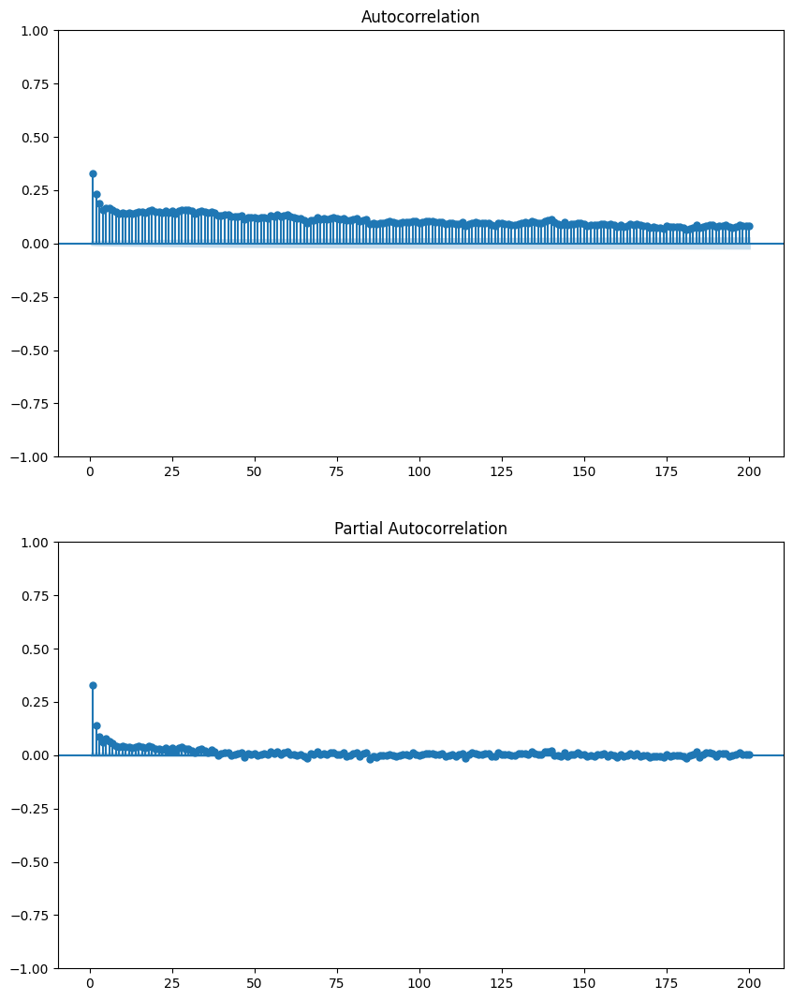

In [20]:
# Plot
plt.figure(figsize=(12, 6))
plt.plot(cold_spots['temp_std'], label='Temp std')
plt.xlabel('Sample Index (stacked across layers)')
plt.ylabel('Temp std')
plt.title('Cold Spots')
plt.grid(True)
plt.tight_layout()
plt.show()

_ = qda.Assumptions(cold_spots['temp_std']).normality()  # Normality check
_ = qda.Assumptions(cold_spots['temp_std']).independence()  # Indipendence check

>As shown in the plots, both normality and independence assumptions are clearly unmet, suggesting that a further data modeling is required.

An initial attempt to achieve normality is to apply a Box-Cox transformation:

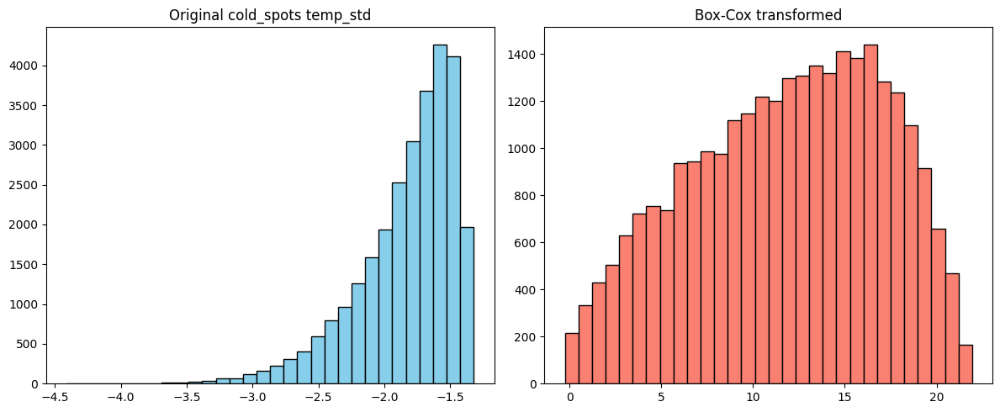

c:\Users\Utente\Documents\PYTHON\envs\qda\lib\site-packages\qdatoolkit\models.py:731: UserWarning: A numpy array was passed to the Assumptions class and converted to Pandas Series.
Note that all other methods in qda-toolkit only accept Pandas Series or Pandas Dataframe.
  warnings.warn(


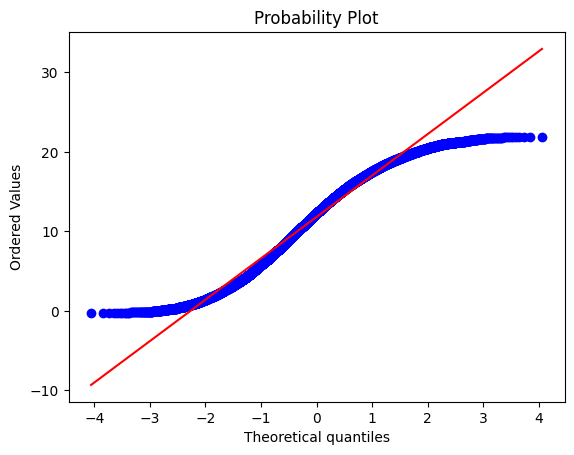

Shapiro-wilk test statistic = 0.973
Shapiro-wilk test p-value = 0.000


In [21]:
# Box-Cox requires values > 0: the data were shifted to be positive
min_val_cs = cold_spots['temp_std'].min()
if min_val_cs <= 0:
    shift = abs(min_val_cs) + 1e-6
else:
    shift = 0

temp_shifted_cs = cold_spots['temp_std'] + shift
temp_boxcox_cs, fitted_lambda_cs = boxcox(temp_shifted_cs)
cold_spots['temp_boxcox_cs'] = temp_boxcox_cs

# Comparison plot: before and after Box-Cox transformation
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.hist(cold_spots['temp_std'], bins=30, color='skyblue', edgecolor='k')
plt.title('Original cold_spots temp_std')
plt.subplot(1,2,2)
plt.hist(temp_boxcox_cs, bins=30, color='salmon', edgecolor='k')
plt.title('Box-Cox transformed')
plt.tight_layout()
plt.show()

# Check of normality assumption
_=qda.Assumptions(temp_boxcox_cs).normality()  

>The data are not still normally distributed

The mean of the Box-Cox temperature value is computed to check the pattern along all the areas

In [22]:
# Compute the mean of 'temp_boxcox_cs' for cold spots per layer
cold_spots_mean_per_layer = cold_spots.groupby('layer_id')['temp_boxcox_cs'].mean().values
print(cold_spots_mean_per_layer)

[ 8.61656895 11.54519271 12.72228607 11.99246946 10.73453914 13.48298494
 11.58018447 10.43142348  9.23008125 10.56394341 12.23476517 11.5793012
 13.84376533 14.07120718 11.42559261 10.86330124 11.4093531  12.62592967
  8.97818867 10.02075836 13.00311833 13.12743728 13.50968116 12.13864926
 11.36908801]


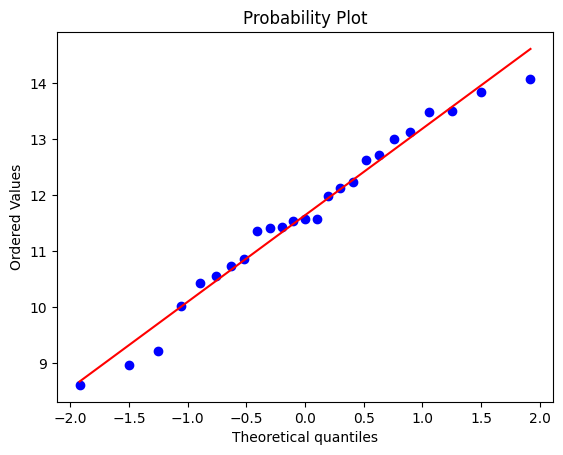

Shapiro-wilk test statistic = 0.970
Shapiro-wilk test p-value = 0.653
Runs test statistic = -0.133
Runs test p-value = 0.894



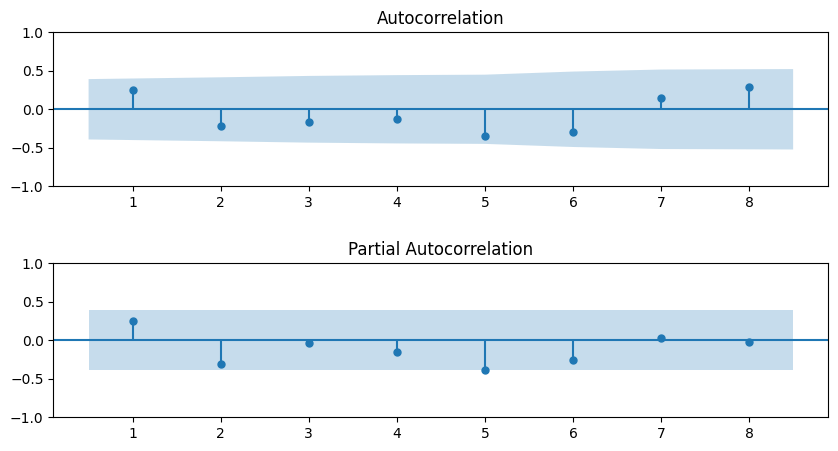

In [23]:
_=qda.Assumptions(cold_spots_mean_per_layer).normality()  # Normality check
_=qda.Assumptions(cold_spots_mean_per_layer).independence()  # Indipendence check

> Now, both assumptions are met allowing the design of the I-MR Control Chart.

#### Hot Spots Analysis

As stated before, the same methodology is applied to Hot Spots

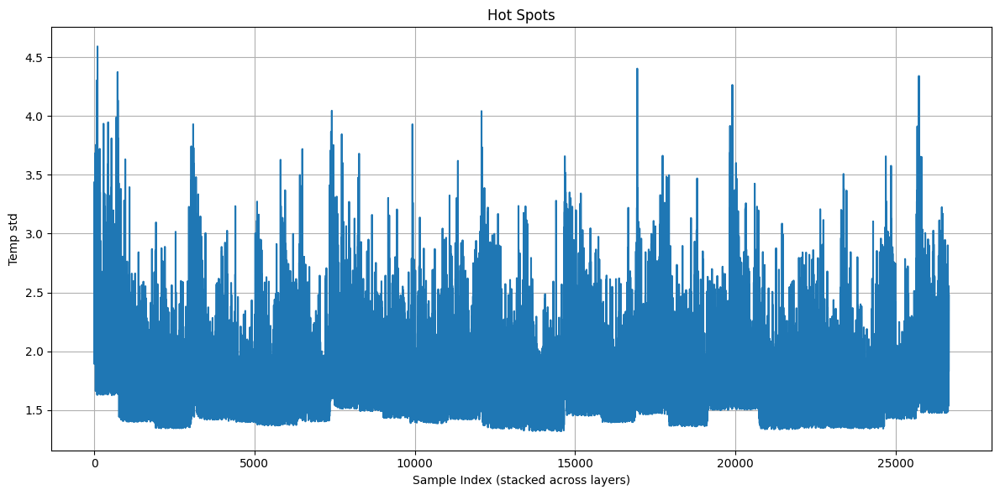

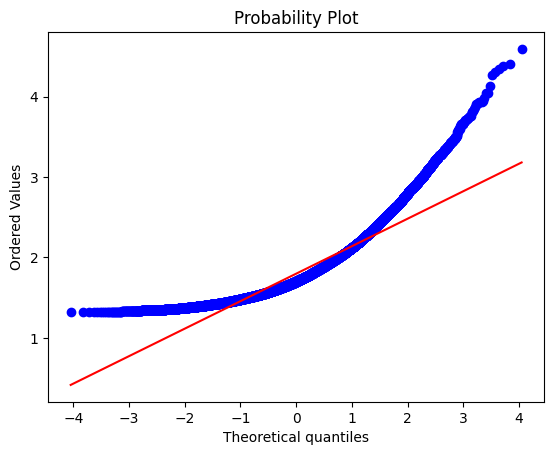

Shapiro-wilk test statistic = 0.870
Shapiro-wilk test p-value = 0.000
Runs test statistic = -28.181
Runs test p-value = 0.000



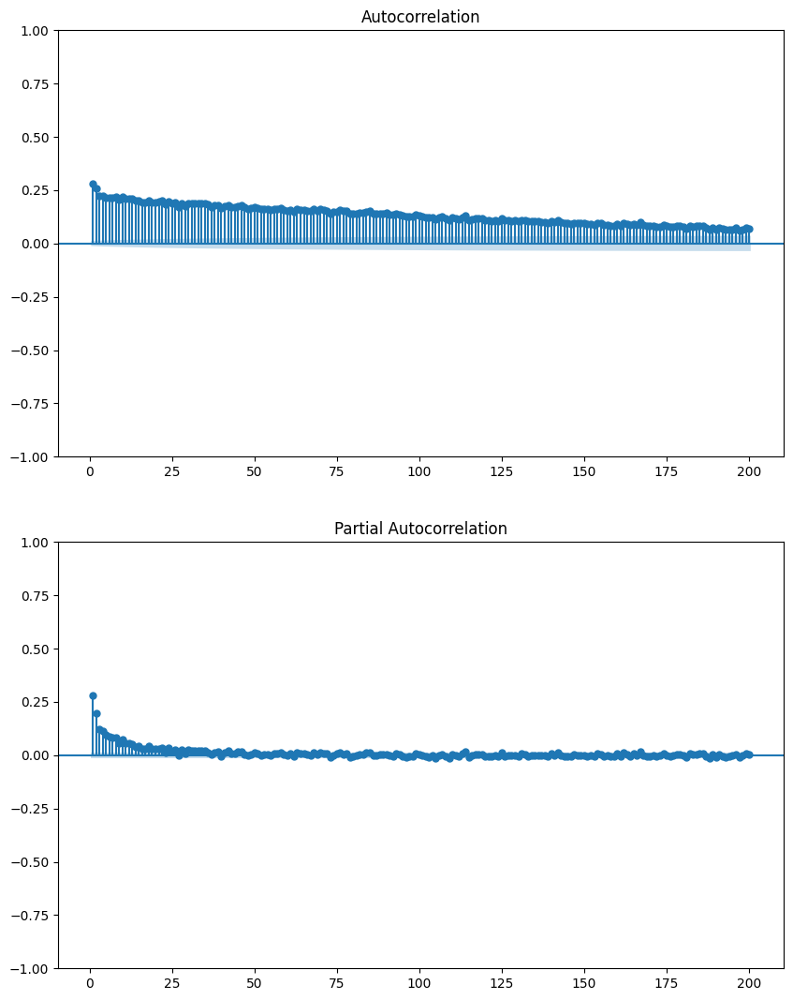

In [24]:
# Plot
plt.figure(figsize=(12, 6))
plt.plot(hot_spots['temp_std'], label='Temp std')
plt.xlabel('Sample Index (stacked across layers)')
plt.ylabel('Temp std')
plt.title('Hot Spots')
plt.grid(True)
plt.tight_layout()
plt.show()

_ = qda.Assumptions(hot_spots['temp_std']).normality()  # Check of normality
_ = qda.Assumptions(hot_spots['temp_std']).independence()  # Check of independence

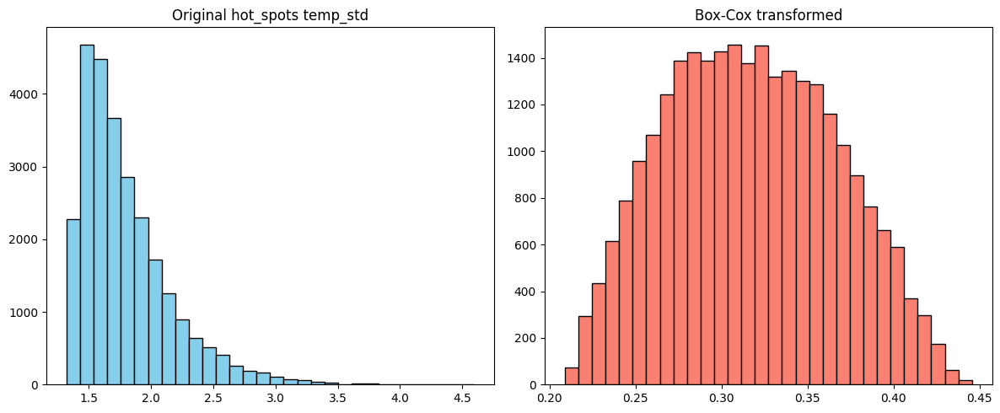

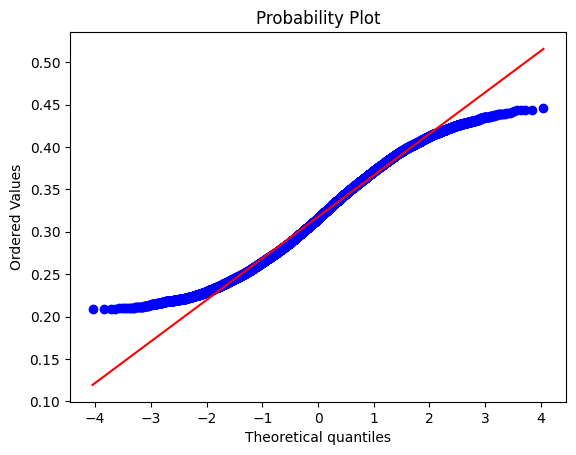

Shapiro-wilk test statistic = 0.986
Shapiro-wilk test p-value = 0.000


In [25]:
# Box-Cox transformation on temperatures
temp_boxcox_hs, fitted_lambda_hs = boxcox(hot_spots['temp_std'])
hot_spots['temp_boxcox_hs'] = temp_boxcox_hs

# Comparison plot: before and after
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.hist(hot_spots['temp_std'], bins=30, color='skyblue', edgecolor='k')
plt.title('Original hot_spots temp_std')
plt.subplot(1,2,2)
plt.hist(temp_boxcox_hs, bins=30, color='salmon', edgecolor='k')
plt.title('Box-Cox transformed')
plt.tight_layout()
plt.show()

_=qda.Assumptions(temp_boxcox_hs).normality() 

In [26]:
# Compute the mean of 'temp_boxcox_hs' for hot spots per layer
hot_spots_mean_per_layer = hot_spots.groupby('layer_id')['temp_boxcox_hs'].mean().values
print(hot_spots_mean_per_layer)

[0.36470816 0.31182231 0.29746129 0.32798539 0.30215127 0.31716886
 0.31108911 0.34518391 0.32102082 0.31515258 0.31018916 0.32167299
 0.30832101 0.30134853 0.33520434 0.30607912 0.33598466 0.30237582
 0.32443831 0.34210906 0.2941318  0.30764554 0.3069588  0.32354142
 0.3426973 ]


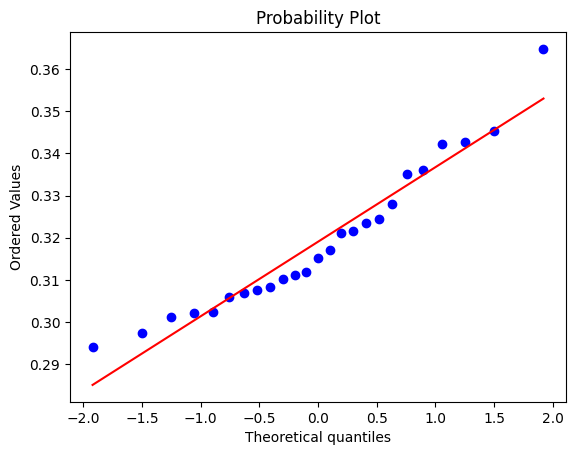

Shapiro-wilk test statistic = 0.939
Shapiro-wilk test p-value = 0.139
Runs test statistic = 0.697
Runs test p-value = 0.486



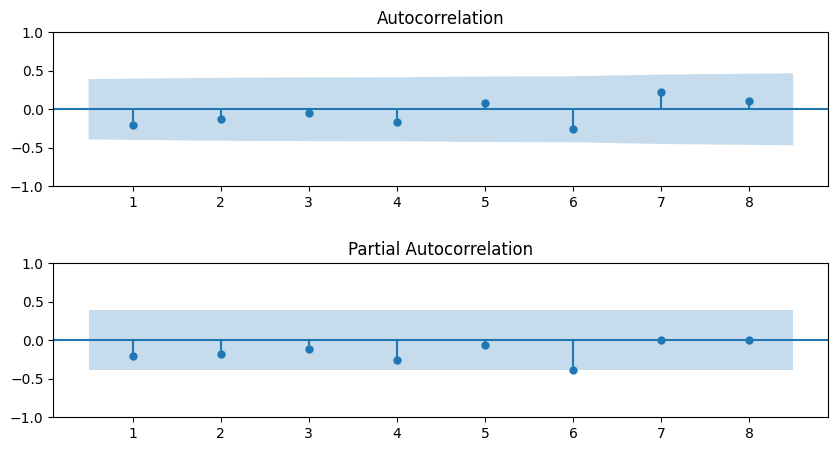

In [27]:
_=qda.Assumptions(hot_spots_mean_per_layer).normality()
_=qda.Assumptions(hot_spots_mean_per_layer).independence()  

>Both assumptions are met allowing the design of the I-MR Control Chart.

### Approach extension (9x9)

#### Cold Spots

Firstly, the $x,y$ space is split into 9 areas with a similar number of cold spots.

In [28]:
# Split x and y into 3 intervals each (3x3=9 areas) with the similar number of points per area
x_area_cs, x_bins_cs = pd.qcut(cold_spots['x'], q=3, labels=False, retbins=True, duplicates='drop')
y_area_cs, y_bins_cs = pd.qcut(cold_spots['y'], q=3, labels=False, retbins=True, duplicates='drop')

# Compute area_id (1-9) based on the position in the 3x3 grid
cold_spots['area_id'] = (y_area_cs * 3 + x_area_cs + 1).astype(int)

cold_spots.head()

,x,y,temp_std,layer_id,temp_boxcox_cs,area_id
0,56,1,-1.737914,1,12.227082,2
1,62,1,-1.816186,1,10.839292,2
2,68,2,-2.182259,1,5.815117,2
3,48,3,-2.951796,1,0.878730,2
4,53,4,-1.808503,1,10.970145,2


In [29]:
# Count the number of points in each area
area_counts = cold_spots['area_id'].value_counts().sort_index()
print(area_counts)

1    3036
2    2743
3    3670
4    3310
5    3095
6    3232
7    3197
8    3472
9    2438
Name: area_id, dtype: int64


The cold spots temperature values are plotted on those 9 areas.

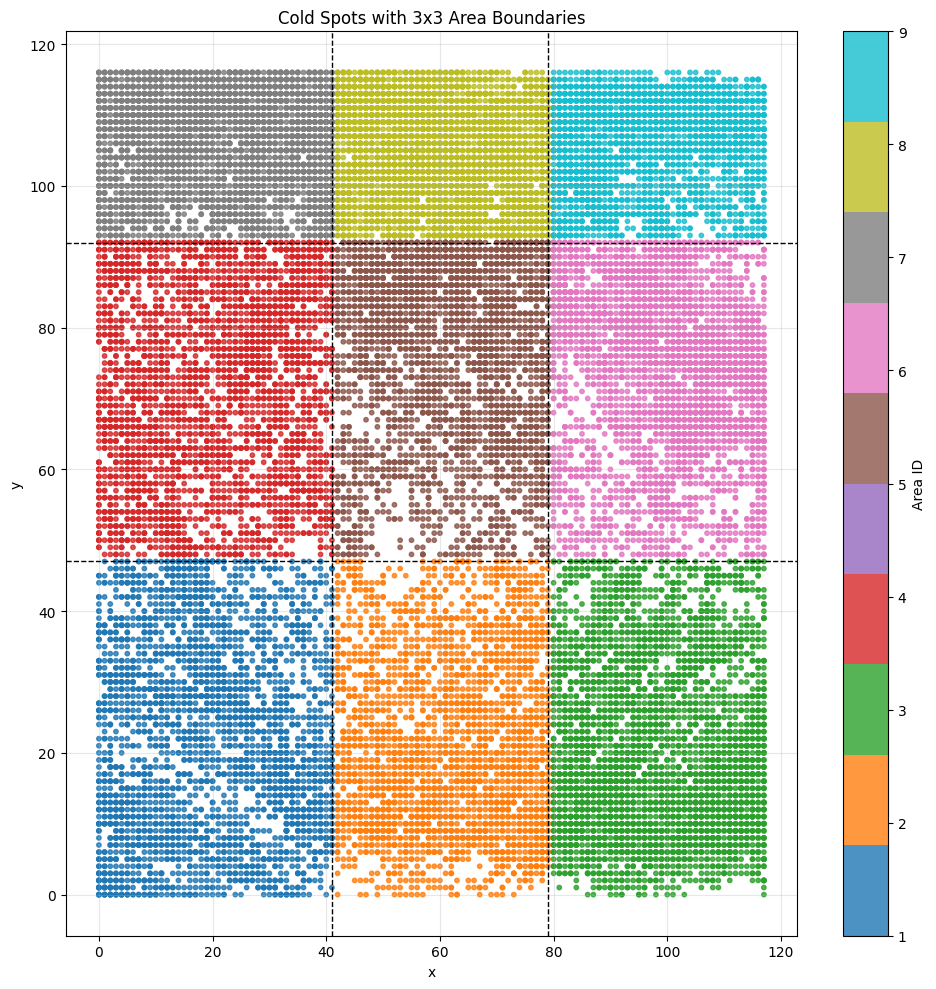

In [30]:
# Plot cold_spots with 3x3 area boundaries

plt.figure(figsize=(10, 10))
scatter = plt.scatter(
    cold_spots['x'], cold_spots['y'],
    c=cold_spots['area_id'], cmap='tab10', s=10, alpha=0.8
)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Cold Spots with 3x3 Area Boundaries')
plt.colorbar(scatter, ticks=range(1, 10), label='Area ID')

# Draw grid lines for area boundaries
for xb in x_bins_cs[1:-1]:
    plt.axvline(x=xb, color='k', linestyle='--', linewidth=1)
for yb in y_bins_cs[1:-1]:
    plt.axhline(y=yb, color='k', linestyle='--', linewidth=1)

plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

>As it can be clearly see in the figure, the 9 areas have different surfaces. 

For each layer in each area, the mean temperature has been calculated.

In [31]:
# Computes the mean temperature (temp_boxcox_cs) for each area_id and layer_id in cold_spots
area_layer_mean_cs = cold_spots.groupby(['area_id', 'layer_id'])['temp_boxcox_cs'].mean().unstack()
print("Cold spots - Mean of temp_boxcox_cs for each area and layer:")
print(area_layer_mean_cs)

Cold spots - Mean of temp_boxcox_cs for each area and layer:
layer_id         1          2          3          4          5          6   \
area_id                                                                      
1          8.104508  10.858552  15.489424  12.378603  14.547300  13.458570   
2          9.137119  13.135493  11.558522  12.908801        NaN  15.069269   
3          8.666960  12.808101  11.394679  14.601040  18.707986        NaN   
4          8.306191  13.611429  15.416362  10.970168  14.349038  14.775581   
5          8.373621  12.409059  13.402387  11.781365  16.541423  12.747940   
6          8.591180  12.894886  16.720709  12.534596  14.321174  15.084114   
7          8.002667  14.677913  14.186228  12.183945   9.638437  14.440613   
8         10.208353  11.558209  15.233062  12.110897   9.734175  12.265010   
9          9.514084   8.988793        NaN  12.107988  10.693940  13.346831   

layer_id         7          8          9          10  ...         16  \
area_id 

Results are merged into a 1D array with NaNs removed to avoid distortion. 
Normality and independence are then tested.


c:\Users\Utente\Documents\PYTHON\envs\qda\lib\site-packages\qdatoolkit\models.py:731: UserWarning: A numpy array was passed to the Assumptions class and converted to Pandas Series.
Note that all other methods in qda-toolkit only accept Pandas Series or Pandas Dataframe.
  warnings.warn(


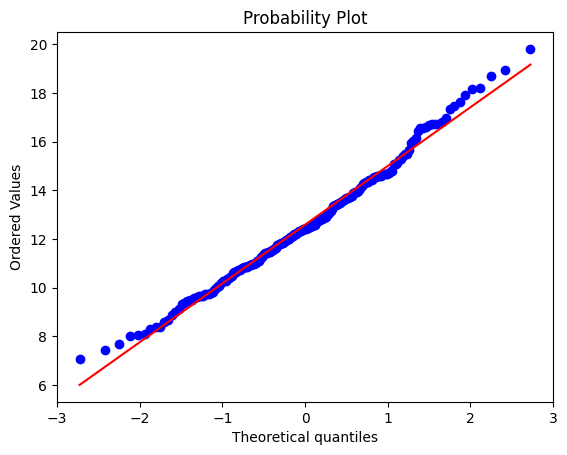

Shapiro-wilk test statistic = 0.990
Shapiro-wilk test p-value = 0.123
Runs test statistic = -0.936
Runs test p-value = 0.349



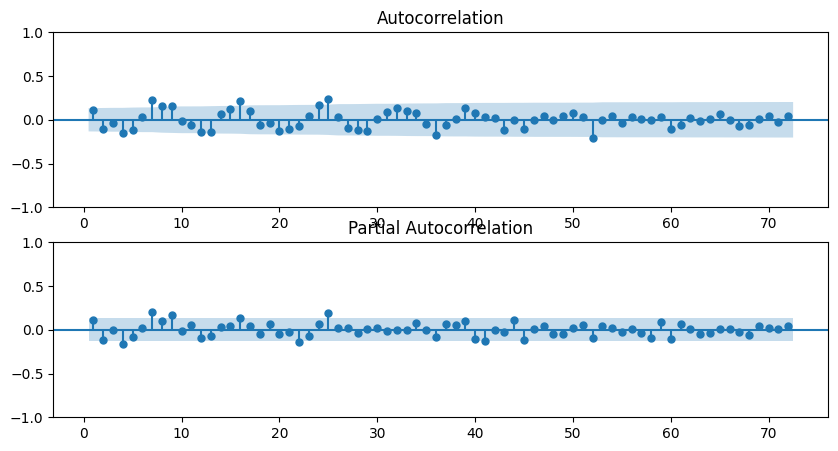

In [32]:
# Merge all area-layer means into a single array for cold_spots (Box-Cox transformed)
all_area_layer_means_cs = area_layer_mean_cs.values.flatten()

# Remove NaN values (some area-layer combinations may not have data)
all_area_layer_means_cs = all_area_layer_means_cs[~np.isnan(all_area_layer_means_cs)]

_ = qda.Assumptions(all_area_layer_means_cs).normality()
_ = qda.Assumptions(all_area_layer_means_cs).independence()

>Both assumptions are met

#### Hot Spots

As stated before, the same methodology is applied to Hot Spots

In [33]:
# Split x and y into 3 intervals each (3x3=9 areas) with the same number of points per area
x_area_hs, x_bins_hs = pd.qcut(hot_spots['x'], q=3, labels=False, retbins=True, duplicates='drop')
y_area_hs, y_bins_hs = pd.qcut(hot_spots['y'], q=3, labels=False, retbins=True, duplicates='drop')

# Compute area_id (1-9) based on the position in the 3x3 grid
hot_spots['area_id'] = (y_area_hs * 3 + x_area_hs + 1).astype(int)

In [34]:
# Count the number of points in each area
area_counts = hot_spots['area_id'].value_counts().sort_index()
print(area_counts)

1    2622
2    3078
3    3224
4    3023
5    3250
6    2616
7    3471
8    2432
9    2946
Name: area_id, dtype: int64


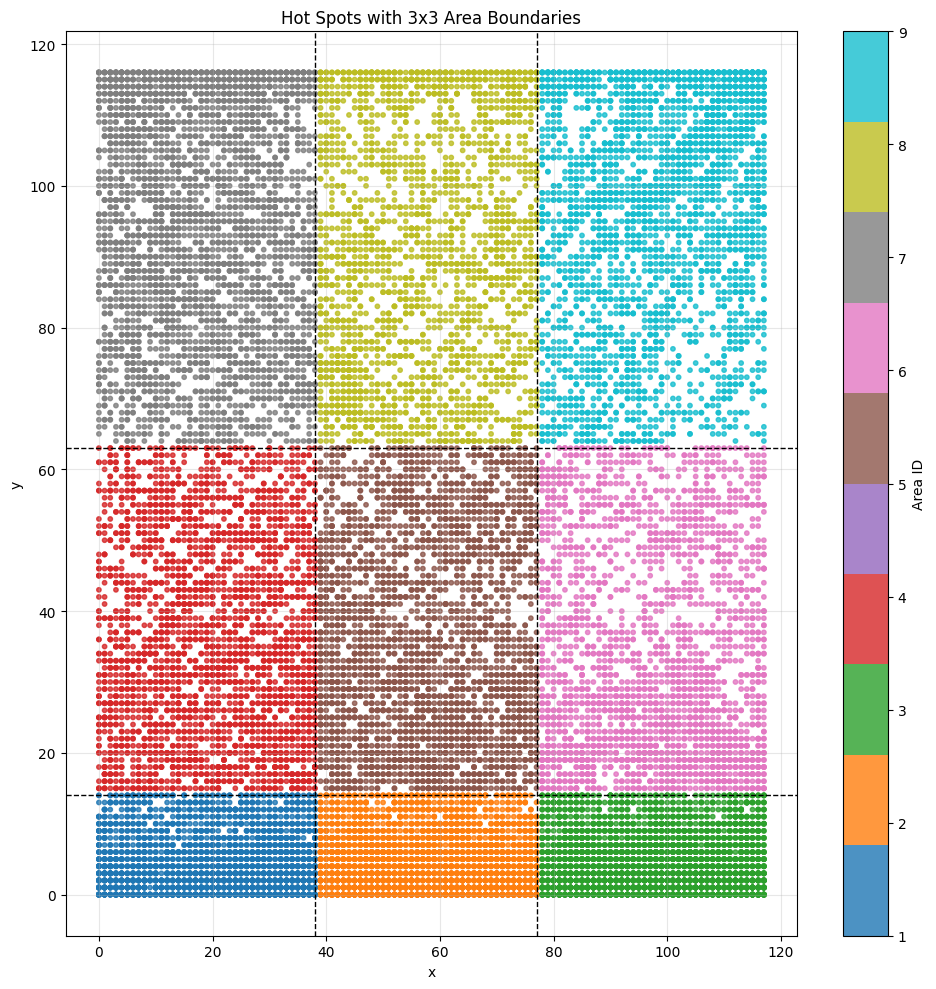

In [35]:
# Plot hot_spots with 3x3 area boundaries

plt.figure(figsize=(10, 10))
scatter = plt.scatter(
    hot_spots['x'], hot_spots['y'],
    c=hot_spots['area_id'], cmap='tab10', s=10, alpha=0.8
)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Hot Spots with 3x3 Area Boundaries')
plt.colorbar(scatter, ticks=range(1, 10), label='Area ID')

# Draw grid lines for area boundaries (hot spots)
for xb in x_bins_hs[1:-1]:
    plt.axvline(x=xb, color='k', linestyle='--', linewidth=1)
for yb in y_bins_hs[1:-1]:
    plt.axhline(y=yb, color='k', linestyle='--', linewidth=1)

plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [36]:
# Computes the mean temperature (temp_boxcox_hs) for each area_id and layer_id in hot spots
area_layer_mean_hs = hot_spots.groupby(['area_id', 'layer_id'])['temp_boxcox_hs'].mean().unstack()
print("Hot spots - Mean of temp_boxcox_hs for each area and layer:")
print(area_layer_mean_hs)


Hot spots - Mean of temp_boxcox_hs for each area and layer:
layer_id        1         2         3         4         5         6   \
area_id                                                                
1         0.371030       NaN  0.295043  0.331624  0.311958  0.338184   
2         0.370545  0.338990  0.316584  0.335875  0.290397  0.325309   
3         0.371798  0.325685  0.291962  0.342134  0.325540  0.321061   
4         0.350457  0.302028  0.299411  0.318749  0.289866  0.301809   
5         0.369683  0.312257  0.291645  0.306872  0.275636  0.312222   
6         0.348101  0.317535  0.281647  0.293877  0.300534  0.289616   
7         0.369680  0.305309  0.285601  0.329159  0.301953  0.321815   
8         0.359406  0.309860  0.296233  0.320182  0.261621  0.321615   
9         0.362108  0.315577  0.298978  0.313856  0.288398       NaN   

layer_id        7         8         9         10  ...        16        17  \
area_id                                           ...                 

c:\Users\Utente\Documents\PYTHON\envs\qda\lib\site-packages\qdatoolkit\models.py:731: UserWarning: A numpy array was passed to the Assumptions class and converted to Pandas Series.
Note that all other methods in qda-toolkit only accept Pandas Series or Pandas Dataframe.
  warnings.warn(


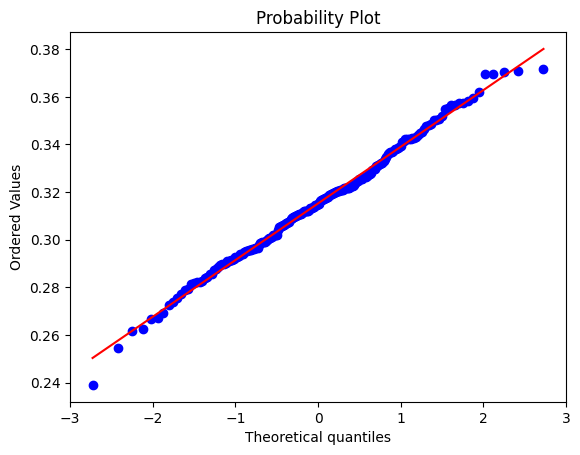

Shapiro-wilk test statistic = 0.995
Shapiro-wilk test p-value = 0.676
Runs test statistic = -0.135
Runs test p-value = 0.893



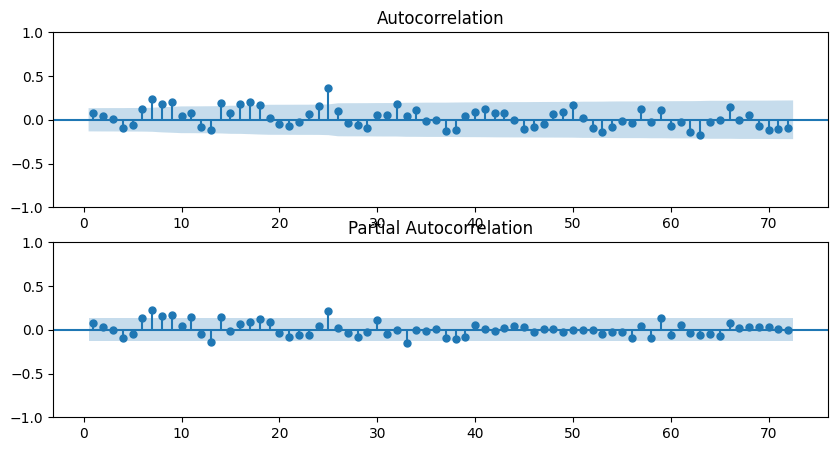

In [37]:
# Merge all area-layer means into a single array for hot_spots (Box-Cox transformed)
all_area_layer_means_hs = area_layer_mean_hs.values.flatten()

# Remove NaN values (some area-layer combinations may not have data)
all_area_layer_means_hs = all_area_layer_means_hs[~np.isnan(all_area_layer_means_hs)]

# Check normality and independence assumptions
_ = qda.Assumptions(all_area_layer_means_hs).normality()
_ = qda.Assumptions(all_area_layer_means_hs).independence()

>Both assumptions are met

### 2.1.2 Methodology for Hot & Cold Points Proximity

Objective: quantitatively assess the spatial proximity between hot and cold spots within each layer.


Cold and hot spot datasets are split into 36 areas (6×6 grid) with aligned boundaries to allow spatial comparison.

Two complementary approaches are implemented to quantify the spatial relationship between hot and cold spots:

- **Color Balance and Density Indicator:**  
    This metric evaluates the relative number of hot versus cold spots within each spatial area. By calculating the proportion and density of hot and cold points in each grid cell, the indicator highlights regions where one type of anomaly predominates.

- **Temperature Difference Indicator:**  
    This indicator measures the mean temperature difference between hot and cold spots within each area. By comparing the average transformed temperature values of hot and cold points in the same grid cell, the metric captures the intensity of thermal contrast. High values indicate areas with pronounced thermal gradients, which may correspond to zones of increased process risk.

In [38]:
# Divide into 6x6 grid using pd.cut with 6 bins for x and y
cold_spots['x_bin'] = pd.cut(cold_spots['x'], bins=6, labels=False, include_lowest=True)
cold_spots['y_bin'] = pd.cut(cold_spots['y'], bins=6, labels=False, include_lowest=True)
hot_spots['x_bin'] = pd.cut(hot_spots['x'], bins=6, labels=False, include_lowest=True)
hot_spots['y_bin'] = pd.cut(hot_spots['y'], bins=6, labels=False, include_lowest=True)

# Compute area_id as a unique identifier for each grid cell
cold_spots['grid_area'] = (cold_spots['y_bin'] * 6 + cold_spots['x_bin']).astype(int)
hot_spots['grid_area'] = (hot_spots['y_bin'] * 6 + hot_spots['x_bin']).astype(int)

An indicator $M$ is introduced to identify anomalies inside each area.

#### Color Balance & Density Indicator

Measures balanced presence and density of red/blue pixels (out of total pixels).

**High:** Near equal red/blue, high total colored pixels.
**Low:** Dominant color OR few total colored pixels.

**Formula:**

$$M = \left( 1 - \frac{|N_b - N_r|}{N_b + N_r + 1} \right) \times \frac{N_b + N_r}{N_{total} + 1}$$

Where $N_b$ = blue pixels, $N_r$ = red pixels, $N_{total}$ = total pixels.

In [39]:
def color_balance_density_metric(num_blue_pixels, num_red_pixels, total_pixels):
  """
  Calculates a metric that is high when blue and red pixels are balanced
  and their density is high.

  Args:
    num_blue_pixels: The number of blue pixels.
    num_red_pixels: The number of red pixels.
    total_pixels: The total number of pixels in the area.

  Returns:
    A float representing the metric value.
  """
  num_colored_pixels = num_blue_pixels + num_red_pixels
  if num_colored_pixels == 0:
    return 0.0

  color_balance = 1 - (abs(num_blue_pixels - num_red_pixels) / (num_colored_pixels + 1))
  density = num_colored_pixels / (total_pixels + 1)

  metric = color_balance * density
  return metric

# Examples to understand the metric:
num_blue = 70
num_red = 70
total = 144
metric_value = color_balance_density_metric(num_blue, num_red, total)
print("Example usages:")
print(f"Metric value: {metric_value}")

num_blue = 130
num_red = 10
total = 144
metric_value = color_balance_density_metric(num_blue, num_red, total)
print(f"Metric value: {metric_value}")

num_blue = 10
num_red = 10
total = 144
metric_value = color_balance_density_metric(num_blue, num_red, total)
print(f"Metric value: {metric_value}")

Example usages:
Metric value: 0.9655172413793104
Metric value: 0.1438004402054292
Metric value: 0.13793103448275862


In [40]:
# Calculate the metric for each grid area within each layer
layer_metrics = []
for layer in sorted(cold_spots['layer_id'].unique()):
    cold_layer = cold_spots[cold_spots['layer_id'] == layer]
    hot_layer = hot_spots[hot_spots['layer_id'] == layer]
    for area_id in range(6 * 6):
        num_blue = (cold_layer['grid_area'] == area_id).sum()
        num_red = (hot_layer['grid_area'] == area_id).sum()
        metric = color_balance_density_metric(num_blue, num_red, 100)
        layer_metrics.append({
            'layer_id': layer,
            'area_id': area_id,
            'num_blue': num_blue,
            'num_red': num_red,
            'metric': metric
        })

layer_grid_metrics = pd.DataFrame(layer_metrics)
layer_grid_metrics.head()

,layer_id,area_id,num_blue,num_red,metric
0,1,0,6,76,0.127162
1,1,1,21,40,0.418876
2,1,2,57,7,0.146230
3,1,3,19,41,0.379808
4,1,4,7,58,0.146265


The advantage of this approach is that anomalies can be visually detected in the plot.

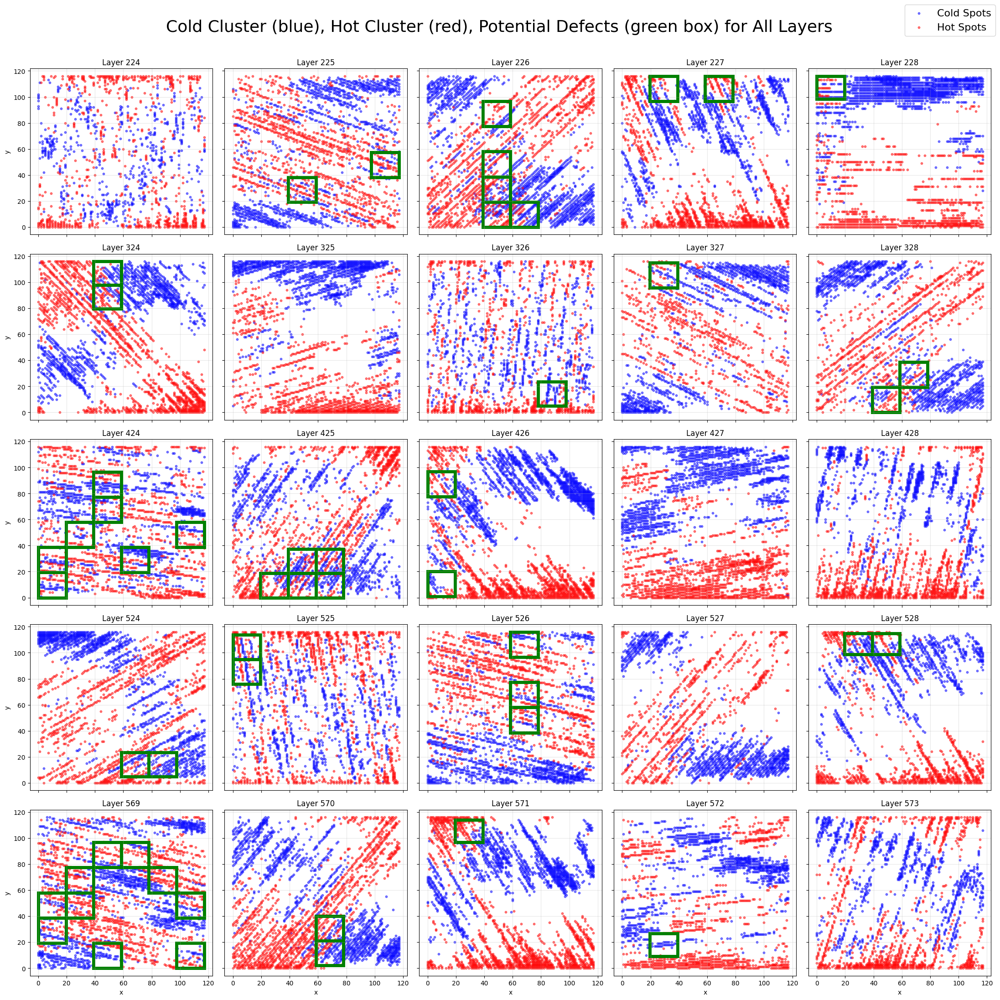

In [41]:
# Graphical representation of regions with high M
fig, axes = plt.subplots(5, 5, figsize=(22, 22), sharex=True, sharey=True)
axes = axes.flatten()

for i, lid in enumerate(sorted(layer_ids)):
    # Filter metrics, cold_spots, and hot_spots for this layer
    layer_metric = layer_grid_metrics[layer_grid_metrics['layer_id'] == i + 1]
    cold_spots_layer = cold_spots[cold_spots['layer_id'] == i + 1]
    hot_spots_layer = hot_spots[hot_spots['layer_id'] == i + 1]

    ax = axes[i]
    ax.scatter(cold_spots_layer['x'], cold_spots_layer['y'], color='blue', s=10, alpha=0.5, label='Cold Spots')
    ax.scatter(hot_spots_layer['x'], hot_spots_layer['y'], color='red', s=10, alpha=0.5, label='Hot Spots')

    # Mark grid cells where metric > 0.5
    highlight_areas = layer_metric[layer_metric['metric'] > 0.5]['area_id'].values
    for area_id in highlight_areas:
        y_bin = area_id // 6
        x_bin = area_id % 6
        x0 = cold_spots_layer['x'].min() + (cold_spots_layer['x'].max() - cold_spots_layer['x'].min()) * x_bin / 6
        x1 = cold_spots_layer['x'].min() + (cold_spots_layer['x'].max() - cold_spots_layer['x'].min()) * (x_bin + 1) / 6
        y0 = cold_spots_layer['y'].min() + (cold_spots_layer['y'].max() - cold_spots_layer['y'].min()) * y_bin / 6
        y1 = cold_spots_layer['y'].min() + (cold_spots_layer['y'].max() - cold_spots_layer['y'].min()) * (y_bin + 1) / 6
        ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, fill=False, edgecolor='green', linewidth=5))

    ax.set_title(f'Layer {lid}')
    ax.grid(True, alpha=0.3)
    if i % 5 == 0:
        ax.set_ylabel('y')
    if i >= 20:
        ax.set_xlabel('x')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', fontsize=16)
fig.suptitle('Cold Cluster (blue), Hot Cluster (red), Potential Defects (green box) for All Layers', fontsize=26)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

> Regions with potential anomalies are highlighted in green. These are selected with a threshold of $M > 0.5$ that is empirically found.

#### Temperature Difference Indicator

For each area and layer, average standardized temperatures are computed separately for hot and cold spots. The absolute difference is then calculated, enabling direct comparison of thermal intensity across space and depth.

Cold spot values are converted to absolute form to treat deviations symmetrically, focusing on anomaly intensity rather than direction. This ensures that computed differences reflect true thermal contrasts, not just directional variation.

In [42]:
# Cold spots mean temperature per area and layer
mean_cold_per_area_layer = cold_spots.groupby(['grid_area', 'layer_id'])['temp_std'].mean().unstack()

# Hot spots mean temperature per area and layer
mean_hot_per_area_layer = hot_spots.groupby(['grid_area', 'layer_id'])['temp_std'].mean().unstack()

print("Media cold per area e layer:")
print(mean_cold_per_area_layer)
print("Media hot per area e layer:")
print(mean_hot_per_area_layer)

# Compute the difference between hot and cold means for each area_id and layer_id
diff_hot_cold_per_area_layer = mean_hot_per_area_layer - (- mean_cold_per_area_layer)
print("Differenza hot-cold per area e layer:")
print(diff_hot_cold_per_area_layer)

Media cold per area e layer:
layer_id         1         2         3         4         5         6   \
grid_area                                                               
0         -2.317519 -1.976109 -1.595408 -1.748119 -1.537275 -1.603093   
1         -2.002677 -1.934797 -1.646852       NaN       NaN -1.539937   
2         -1.997303 -1.781083 -1.805174       NaN       NaN -1.738854   
3         -1.975108 -1.792843 -1.961847       NaN       NaN       NaN   
4         -2.290533 -1.822366 -2.019733       NaN       NaN       NaN   
5         -2.287675 -1.809922 -1.934206 -1.550195       NaN       NaN   
6         -1.965362 -1.636114 -1.556631 -1.747562 -1.642928 -1.704897   
7         -1.913422 -1.525822 -1.535916 -1.679094 -1.428099 -1.763605   
8         -1.926987 -1.565593 -1.659109 -1.759489       NaN -1.647000   
9         -1.898554 -1.629099 -1.837593 -1.702403       NaN -1.623379   
10        -1.814307 -1.469236 -1.806672 -1.629143       NaN       NaN   
11        -1.874110 -1

To assess normality of hot–cold differences across areas and layers, a Box-Cox transformation is applied. Data are shifted to be strictly positive, then flattened and transformed excluding missing values.

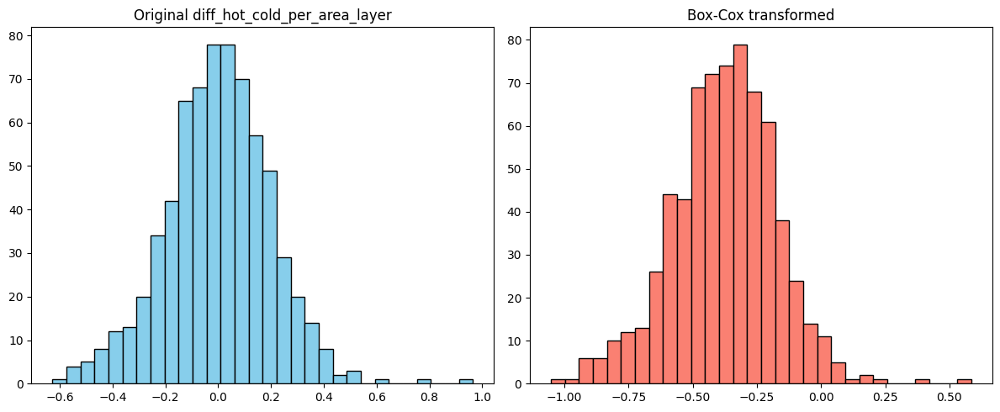

c:\Users\Utente\Documents\PYTHON\envs\qda\lib\site-packages\qdatoolkit\models.py:731: UserWarning: A numpy array was passed to the Assumptions class and converted to Pandas Series.
Note that all other methods in qda-toolkit only accept Pandas Series or Pandas Dataframe.
  warnings.warn(


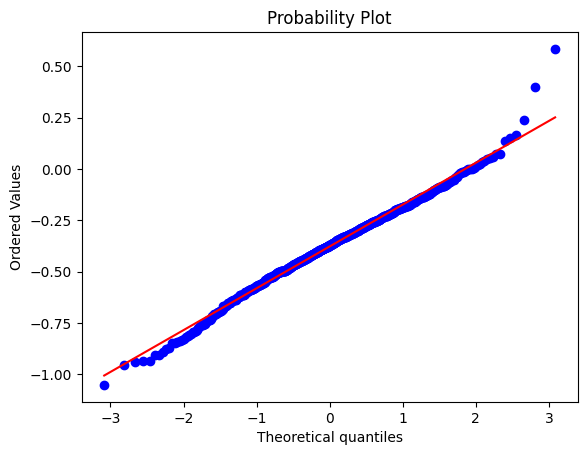

Shapiro-wilk test statistic = 0.992
Shapiro-wilk test p-value = 0.001


In [43]:
# Flatten the values into a 1D array, ignoring NaNs
diff_values = diff_hot_cold_per_area_layer.values.flatten()
diff_values = diff_values[~np.isnan(diff_values)]

# Box-Cox requires values > 0, so shift if necessary
min_val = diff_values.min()
if min_val <= 0:
    shift = abs(min_val) + 1e-6
else:
    shift = 0

diff_shifted = diff_values + shift
diff_boxcox, fitted_lambda = boxcox(diff_shifted)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.hist(diff_values, bins=30, color='skyblue', edgecolor='k')
plt.title('Original diff_hot_cold_per_area_layer')
plt.subplot(1,2,2)
plt.hist(diff_boxcox, bins=30, color='salmon', edgecolor='k')
plt.title('Box-Cox transformed')
plt.tight_layout()
plt.show()

_ = qda.Assumptions(diff_boxcox).normality()  

> Following the Box-Cox transformation, the distribution of the hot–cold difference values appeares approximately normal. The Q–Q plot shows that the majority of data points align well along the theoretical quantile line, indicating an overall good fit to the normal distribution. However, some deviations are observed in the tails, where a number of points diverge from the reference line, suggesting the presence of mild outliers or heavier tails than expected under perfect normality. Despite these tail deviations, the distribution is considered sufficiently normal for the purposes of subsequent analyses.

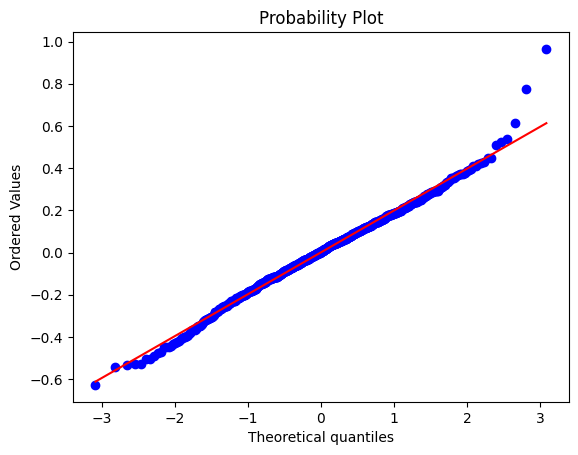

Shapiro-wilk test statistic = 0.992
Shapiro-wilk test p-value = 0.001
Runs test statistic = -0.801
Runs test p-value = 0.423



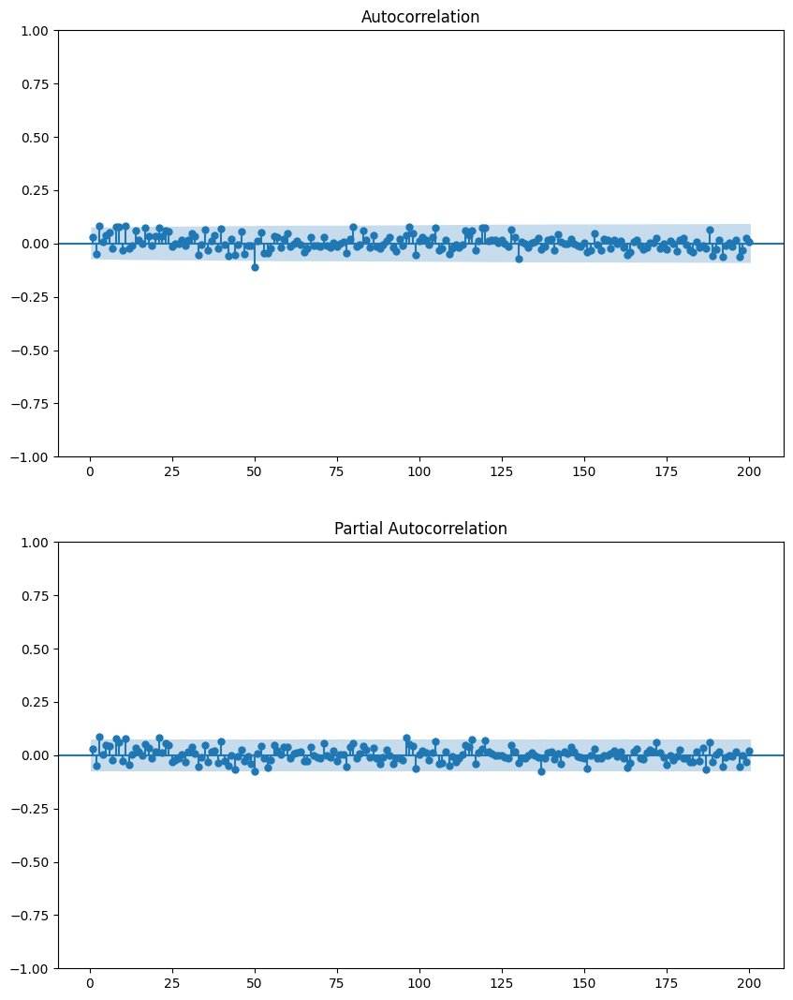

In [44]:
diff_hot_cold_values = diff_hot_cold_per_area_layer.values.flatten()
df_diff_hot_cold_long = pd.DataFrame(diff_hot_cold_values, columns=['diff_hot_cold'])
_=qda.Assumptions(df_diff_hot_cold_long['diff_hot_cold']).normality()  # Check of normality
_=qda.Assumptions(df_diff_hot_cold_long['diff_hot_cold']).independence()  # Controllo of independence

> Both assuptions are met

## 2.2 Regular temperatures cluster analysis

Finally, regular data points from the “Biggest Cluster,” assumed to represent baseline temperatures, are also analyzed. Detecting out-of-control signals here may indicate anomalies in measurement or classification.

A dataframe represented the regular points is created from the Biggest Cluster

In [45]:
# Iterate through each layer's biggest cluster data
low_T2_cluster_list = []
for layer_data in biggest_cluster_pixels:
    layer_id = layer_data['layer']
    pixel_coordinates = layer_data['pixel_coordinates']
    pixel_values = layer_data['pixel_values']
    
    # Add each pixel's data to the list
    for (y, x), temp_std in zip(pixel_coordinates, pixel_values):
        low_T2_cluster_list.append({'x': x, 'y': y, 'temp_std': temp_std, 'layer_id': layer_id})

# Create a DataFrame from the list
low_T2_cluster = pd.DataFrame(low_T2_cluster_list)
low_T2_cluster.head()

,x,y,temp_std,layer_id
0,1,0,1.368609,1
1,3,0,0.606690,1
2,5,0,0.475641,1
3,9,0,1.329965,1
4,11,0,0.945900,1


Given the high dimensionality of the initial dataset, a gapping process methodology is implemented to manage computational resources effectively.

In [46]:
# Gapping on the low_T2_cluster DataFrame by keeping 1 row every 5
generate_temperature_matrices_v1_size = 5
gapped_data = low_T2_cluster.iloc[::5].reset_index(drop=True)
gapped_data.head() 

,x,y,temp_std,layer_id
0,1,0,1.368609,1
1,13,0,0.973318,1
2,25,0,-0.714688,1
3,34,0,1.174879,1
4,41,0,0.929085,1


Normality and Indipendence assumptions are checked on the new dataframe

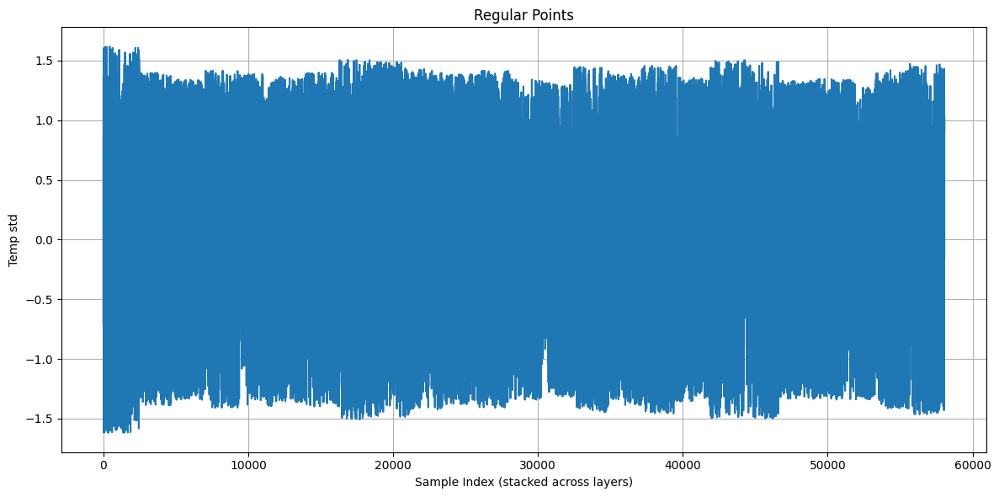

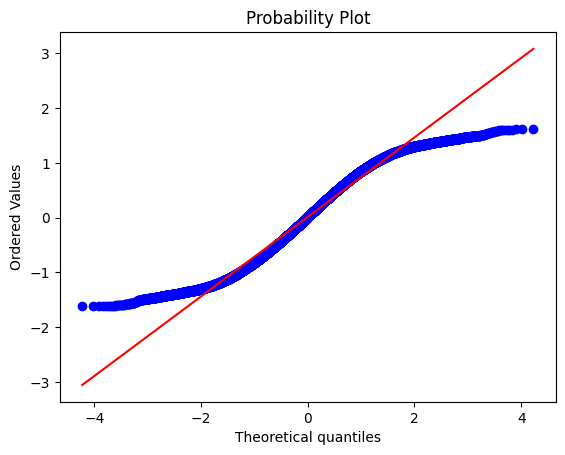

c:\Users\Utente\Documents\PYTHON\envs\qda\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Shapiro-wilk test statistic = 0.976
Shapiro-wilk test p-value = 0.000
Runs test statistic = -38.260
Runs test p-value = 0.000



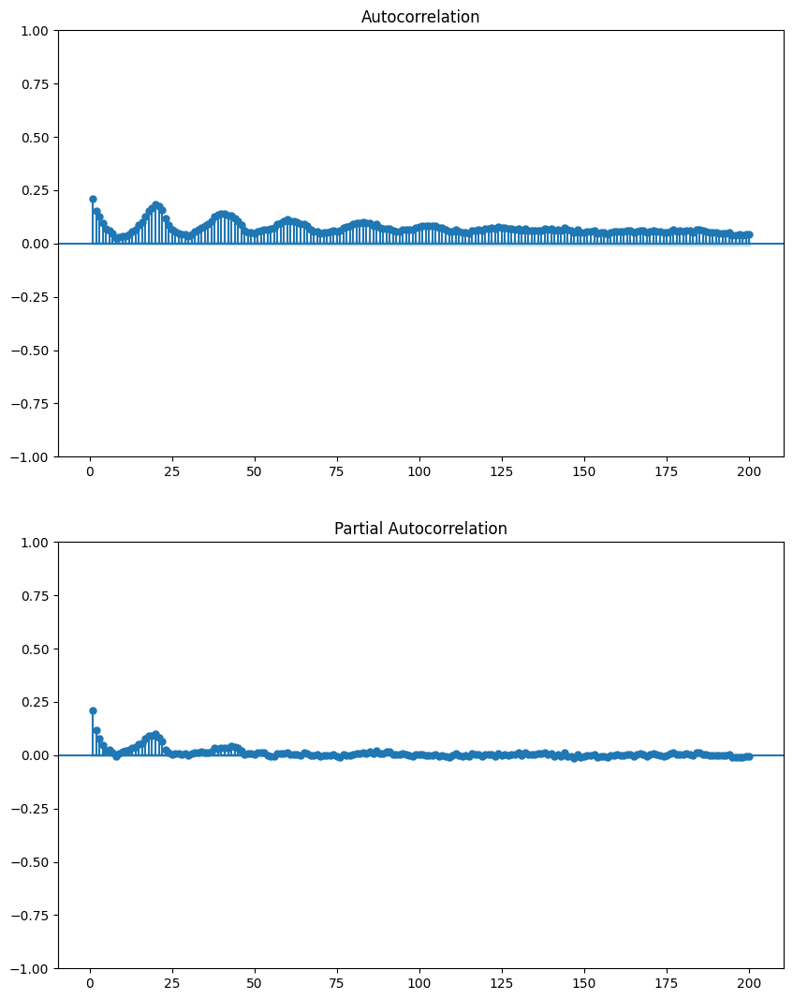

In [47]:
# Plot
plt.figure(figsize=(12, 6))
plt.plot(gapped_data['temp_std'], label='Temp std')
plt.xlabel('Sample Index (stacked across layers)')
plt.ylabel('Temp std')
plt.title('Regular Points')
plt.grid(True)
plt.tight_layout()
plt.show()

_ = qda.Assumptions(gapped_data['temp_std']).normality()
_ = qda.Assumptions(gapped_data['temp_std']).independence()  

>The plots indicates a violation of the underlying statistical assumptions. The high dimensionality of the dataframe is still a limit when computing the Shapiro-Wilk test.

The mean of the temperature values on each layer is computed.

In [48]:
regular_point_mean_per_layer = gapped_data.groupby('layer_id')['temp_std'].mean().values
print(regular_point_mean_per_layer)

[-0.04330063  0.02659924  0.06624767 -0.00830716  0.10003022 -0.02831249
  0.02571578 -0.02860079  0.07535003  0.06673455  0.01556395  0.03782593
  0.00938679  0.00152004 -0.03344583  0.03168277 -0.03037192  0.02592663
  0.0592009  -0.00358962  0.04613031 -0.01127972 -0.01064076 -0.00497811
 -0.03870691]


c:\Users\Utente\Documents\PYTHON\envs\qda\lib\site-packages\qdatoolkit\models.py:731: UserWarning: A numpy array was passed to the Assumptions class and converted to Pandas Series.
Note that all other methods in qda-toolkit only accept Pandas Series or Pandas Dataframe.
  warnings.warn(


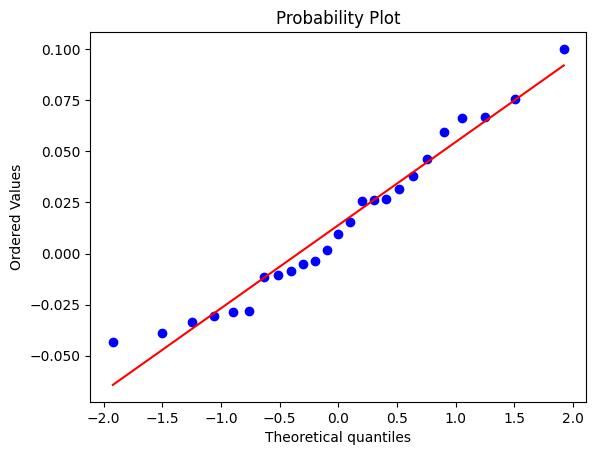

Shapiro-wilk test statistic = 0.957
Shapiro-wilk test p-value = 0.354
Runs test statistic = 0.622
Runs test p-value = 0.534



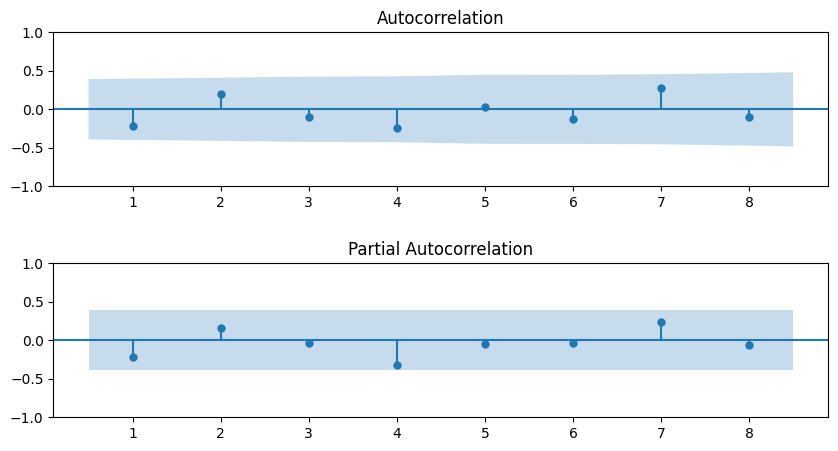

In [49]:
_=qda.Assumptions(regular_point_mean_per_layer).normality()  # Check Normality
_=qda.Assumptions(regular_point_mean_per_layer).independence()  # Check Independence

>Assumptions are met

# Results

## 1. Between-layer analysis

### I-MR Charts of the first $m$ principal components

For semplicity, a control chart using only the first $m = 3$ principal components is designed.
Being $\alpha_{\text{fam}} = 0.01$ the family-wise type I error, and being the two PCs independent, the Šidák correction is applied.

0.003344506587403595
K = 2.934


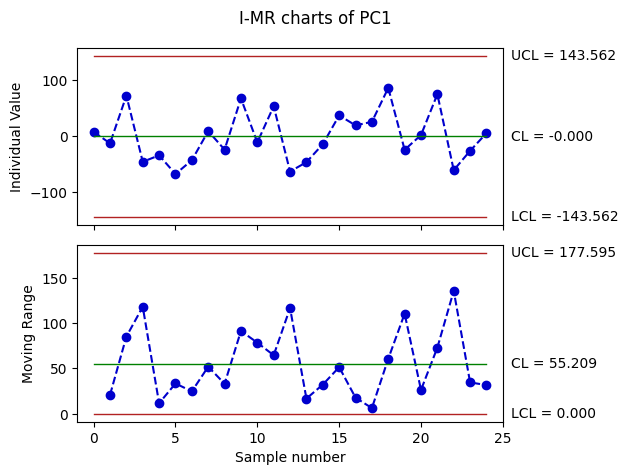

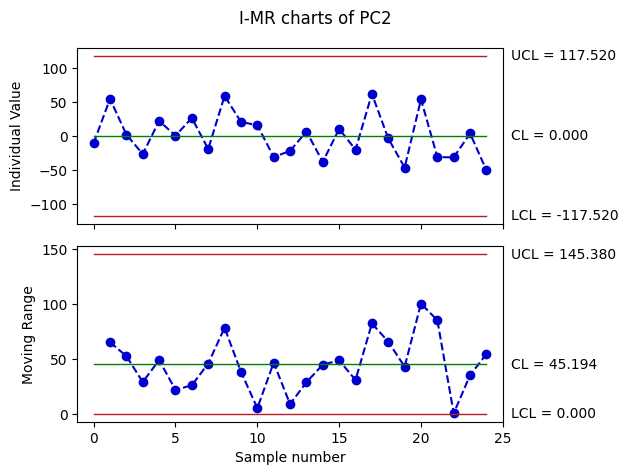

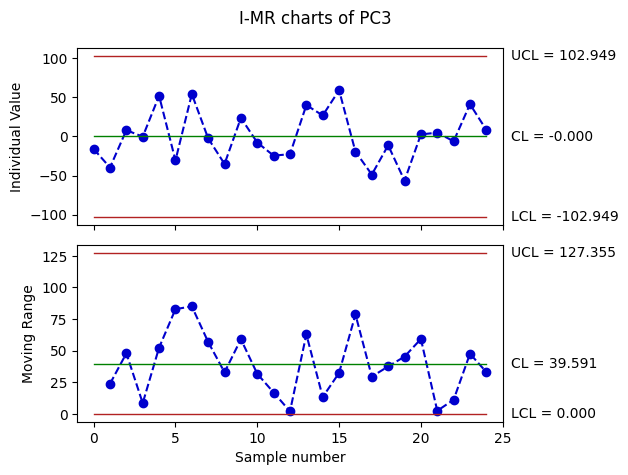

In [50]:
# Compute the K_alpha
alpha_fam = 0.01
alpha = 1 - (1 - alpha_fam)**(1/3)
print(alpha)
K_alpha = stats.norm.ppf(1 - alpha/2)
print('K = {:.3f}'.format(K_alpha))

Z_df = pd.DataFrame(Z, columns=[f"PC{i+1}" for i in range(Z.shape[1])])
_ = qda.ControlCharts.IMR(Z_df, "PC1", K=K_alpha)
_ = qda.ControlCharts.IMR(Z_df, "PC2", K=K_alpha)
_ = qda.ControlCharts.IMR(Z_df, "PC3", K=K_alpha)

All the layers appear to be in control. One limitation of this approach is that the first 3 principal components only explain 34% of the variance. To explain 60% of the variance 9 PCs are needed. Having 9 control charts is not practical and also the alpha of each of each CC will be too small making the charts less sensitive to detecting small but potentially important process shifts within each individual PC. 

### Hotelling $T^2$ Time series and Ellipse Control Chart
For a more comprehensive multivariate statistical process control (MSPC) approach, Hotelling's $T^2$ control chart is applied to analyze the principal components jointly. [1]

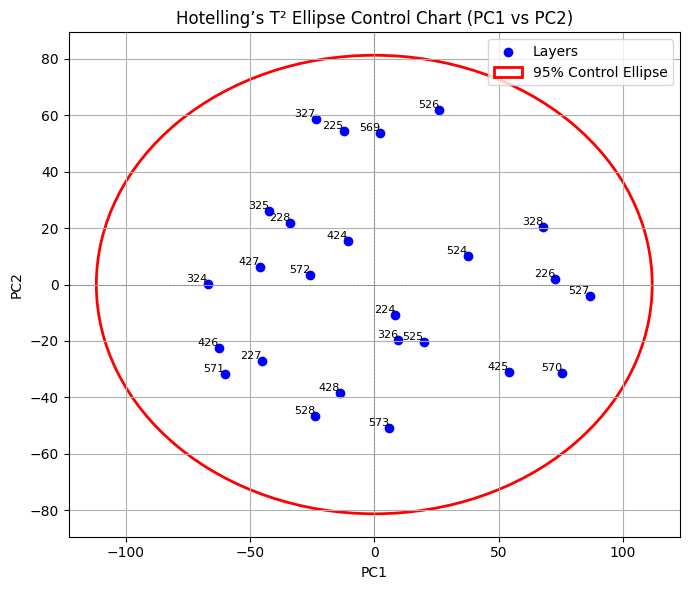

In [51]:
# Assume you already have:
# Z = scores[:, :2]  # First two principal components (shape: J × 2)
Z2 = Z[:, :2]  # Get first two PCs
J = Z2.shape[0]

# Compute mean and covariance of the 2D scores
mu = np.mean(Z2, axis=0)
cov = np.cov(Z2.T)

# Get the Mahalanobis distance threshold from Chi-squared dist with 2 df
alpha = 0.05  # 95% confidence ellipse
threshold = chi2.ppf(1 - alpha, df=2)

# Eigen-decomposition for ellipse axes
eigvals, eigvecs = np.linalg.eigh(cov)
order = eigvals.argsort()[::-1]
eigvals, eigvecs = eigvals[order], eigvecs[:, order]

# Width and height of ellipse (2*sqrt for full width)
width, height = 2 * np.sqrt(threshold * eigvals)
angle = np.degrees(np.arctan2(*eigvecs[:,0][::-1]))

# Plot
fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(Z2[:, 0], Z2[:, 1], c='blue', label='Layers')
ellipse = Ellipse(xy=mu, width=width, height=height, angle=angle,
                  edgecolor='red', fc='None', lw=2, label='95% Control Ellipse')
ax.add_patch(ellipse)


# Add layer IDs as labels near the points
for i, (x, y) in enumerate(Z2):
    ax.text(x, y, str(layer_ids[i]), fontsize=8, color='black', ha='right', va='bottom')
ax.axhline(0, color='gray', linestyle='--', linewidth=0.5)
ax.axvline(0, color='gray', linestyle='--', linewidth=0.5)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_title("Hotelling’s T² Ellipse Control Chart (PC1 vs PC2)")
ax.legend()
ax.grid(True)
plt.tight_layout()
plt.show()


> All layers are in control as are positioned inside the ellipse. This representation shows points in the PC1–PC2 projection. 

To explore further a time series $T^2$ is created. The ellipse reflects only a 2D projection of the data, while the T² statistic accounts for all retained principal components.

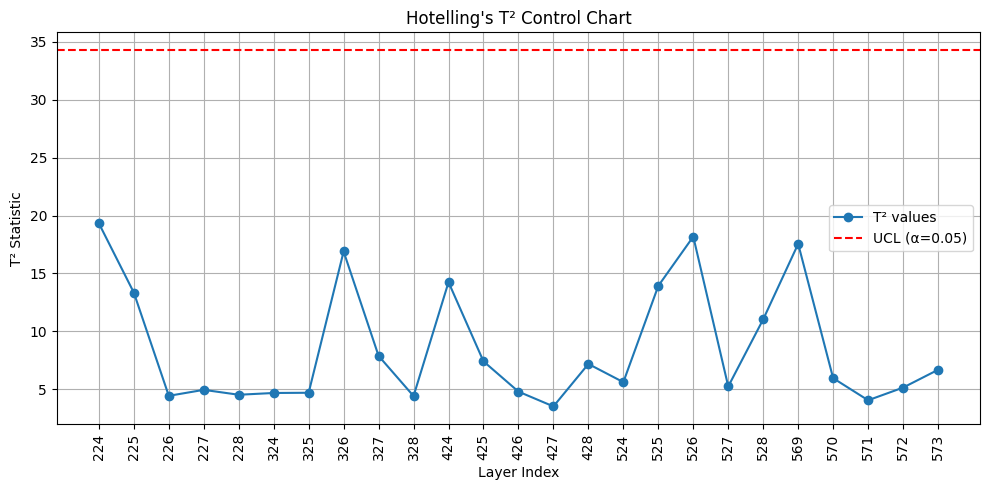

In [52]:
# Shape of T2_frame: (J,), where J = number of frames
J = len(T2_frame)
m = Z.shape[1]  # Number of retained principal components

# --- Compute UCL using F-distribution ---
alpha = 0.05  # Significance level
UCL = (m * (J - 1) / (J - m)) * f.ppf(1 - alpha, m, J - m)


# --- Control chart ---
plt.figure(figsize=(10, 5))
plt.plot(range(1, J + 1), T2_frame, marker='o', label="T² values")
plt.axhline(y=UCL, color='r', linestyle='--', label=f'UCL (α={alpha})')
plt.title("Hotelling's T² Control Chart")
plt.xlabel("Layer Index")
plt.ylabel("T² Statistic")
# Replace x-axis indices with layer IDs
layer_indices = range(1, J + 1)
plt.xticks(layer_indices, layer_ids, rotation=90)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

All the layers are in control.

### Control chart for small shifts

Two main phenomena are detected:
- The UCL in the Control Chart is significantly higher compared to the point with the highest value of T^2 statistics;
- Looking at the pattern within the data, there are small trends in consecutive points. Possibly signaling small shifts in the mean

To address this, a MEWMA (Multivariate Exponential Weighted Moving Average) control chart is applied.

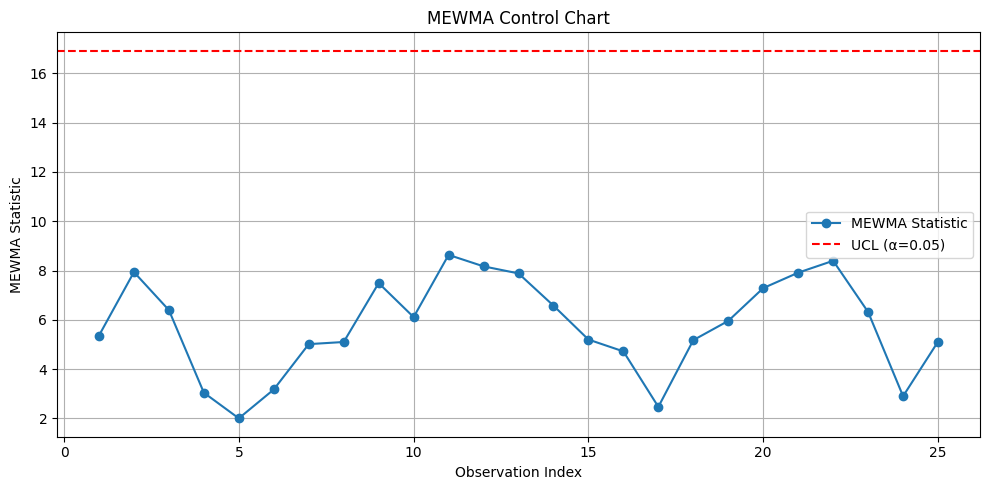

In [53]:
# Parameters
lambda_ = 0.15  # Smoothing parameter (between 0.1 and 0.3)
alpha = 0.05   # Significance level

# Shape
Z = np.asarray(Z)           # Ensure Z is a NumPy array
J, p = Z.shape              # J: number of samples, p: number of variables

# Mean vector and covariance matrix
mu = np.mean(Z, axis=0)
Sigma = np.cov(Z.T)        # Covariance of the original data

# --- MEWMA Statistic Computation ---
Z_t = np.zeros(p)          # Initial MEWMA vector
S_t_list = []

for i in range(J):
    Z_t = lambda_ * (Z[i] - mu) + (1 - lambda_) * Z_t
    S_t = Z_t.T @ np.linalg.inv((lambda_ / (2 - lambda_)) * Sigma) @ Z_t
    S_t_list.append(S_t)

S_t_list = np.array(S_t_list)

# --- UCL Computation using Chi-squared distribution ---
UCL = chi2.ppf(1 - alpha, df=p)

# --- Plot MEWMA Chart ---
plt.figure(figsize=(10, 5))
plt.plot(range(1, J + 1), S_t_list, marker='o', label='MEWMA Statistic')
plt.axhline(y=UCL, color='r', linestyle='--', label=f'UCL (α={alpha})')
plt.title('MEWMA Control Chart')
plt.xlabel('Observation Index')
plt.ylabel('MEWMA Statistic')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


> No points are out of control.

### Benchmark Analysis

To assess the robustness of the methodology shown above, a comparison with a naive approach is represented. This simple approach analyzes the average temperature of each layer in a time series.

Temperatures are filtered to remove possible outliers influencing the mean. The inter-quartile range (IQR) method is used.

In [54]:
# Remove outliers using the IQR method
Q1 = df.groupby('layer_id')['temp'].quantile(0.25)
Q3 = df.groupby('layer_id')['temp'].quantile(0.75)
IQR = Q3 - Q1

# Filter out rows where 'temp' is outside 1.5*IQR range
df_filtered = df[~((df['temp'] < (Q1.loc[df['layer_id']].values - 1.5 * IQR.loc[df['layer_id']].values)) | 
                  (df['temp'] > (Q3.loc[df['layer_id']].values + 1.5 * IQR.loc[df['layer_id']].values)))]

average_temp_by_layer = df_filtered.groupby('layer_id')['temp'].mean()
print(average_temp_by_layer)

layer_id
224    1563.300651
225    1562.460317
226    1559.696374
227    1546.099312
228    1546.902505
324    1548.329838
325    1546.126857
326    1560.087712
327    1561.029390
328    1559.912232
424    1559.333656
425    1557.848557
426    1539.755721
427    1539.002516
428    1552.921944
524    1562.111191
525    1561.924910
526    1564.870017
527    1558.555772
528    1541.306634
569    1561.172226
570    1560.992887
571    1544.873048
572    1544.631318
573    1554.440113
Name: temp, dtype: float64


Runs test statistic = -1.706
Runs test p-value = 0.088



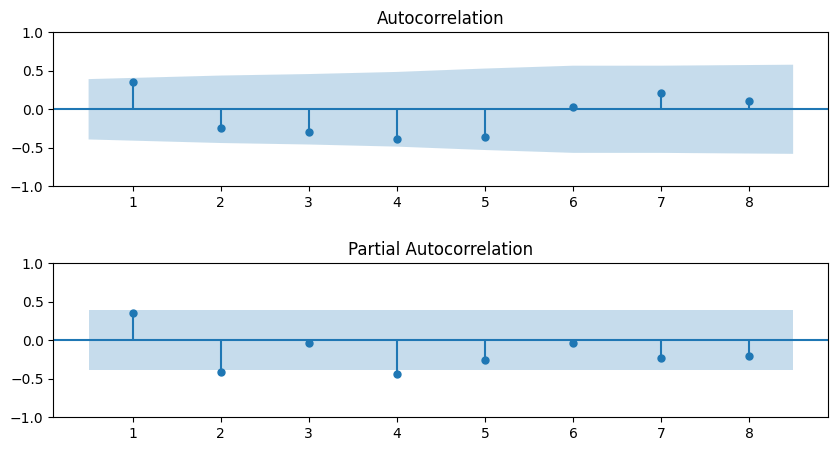

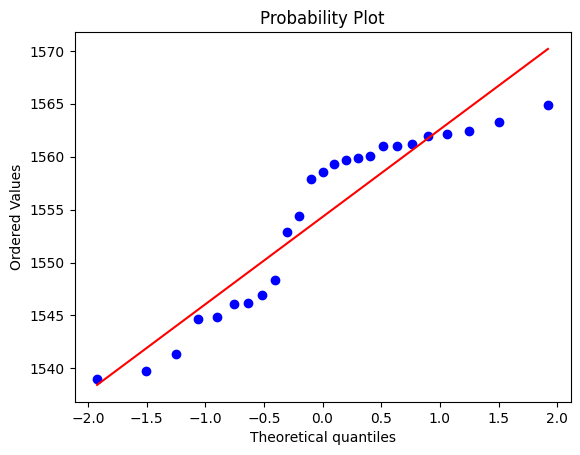

Shapiro-wilk test statistic = 0.871
Shapiro-wilk test p-value = 0.005


In [55]:
independence_statistic, independence_pvalue = qda.Assumptions(average_temp_by_layer).independence()
normality_statistic, normality_pvalue = qda.Assumptions(average_temp_by_layer).normality()

> The data is independent but not normal.

Nevertheless, even if the assumptions are not met a I-MR control chart is plotted to show the time series.

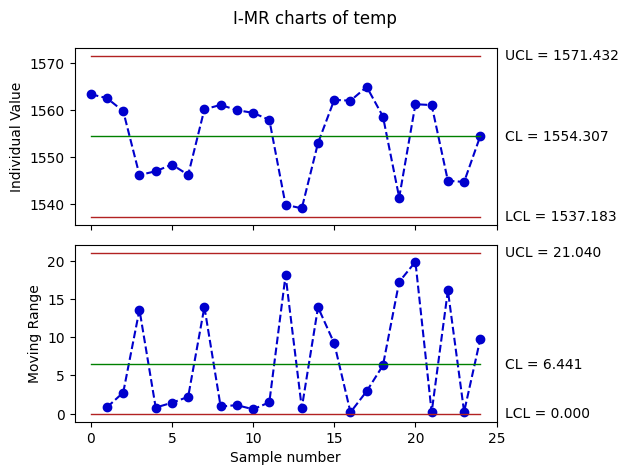

In [56]:
average_temp_df = average_temp_by_layer.reset_index()
average_temp_df.columns = ['layer_id', 'temp']  # Rename columns to match expected input
# Use the DataFrame in the IMR control chart
_ = qda.ControlCharts.IMR(average_temp_df, "temp", K=3)

The mean of the process does not look stationary as there are shifts in the mean. And the control limits cannot be used as the assumptions are not met.

## 2. Within-layer analysis

## 2.1. Extreme temperatures cluster analysis

### 2.1.1 Methodology for investigating the Temperatures of Cold and Hot Spots

#### Cold Spots Analysis

Design of the I-MR Control Chart on cold_spots_mean_per_layer dataframe

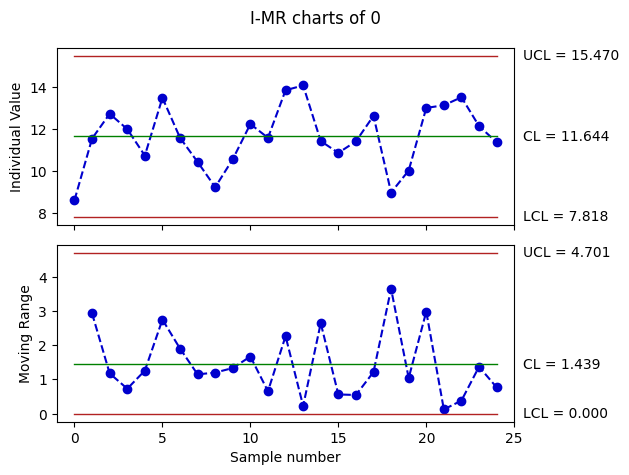

In [57]:
df_SCC_cts = pd.DataFrame(cold_spots_mean_per_layer, columns=['0'])

# I-MR control chart
df_SCC_IMR_cts = qda.ControlCharts.IMR(df_SCC_cts, '0')

>No Out Of Control are detected: the presence of extreme values can be excluded

As stated before, this "quick & dirty" approach has a clear lack : considering the mean of high quantity of data has the effect of cut the variability of the data, not allowing the anomalies identification.

#### Hot Spots Analysis

Design of the I-MR Control Chart on hot_spots_mean_per_layer dataframe

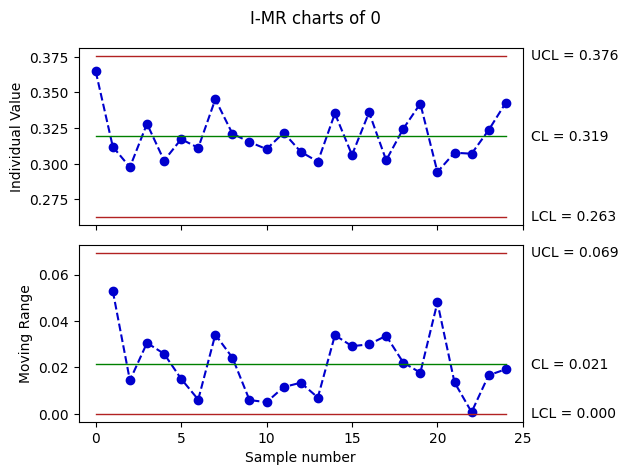

In [58]:
df_SCC_ths = pd.DataFrame(hot_spots_mean_per_layer, columns=['0'])

# I-MR control chart
df_SCC_IMR_ths = qda.ControlCharts.IMR(df_SCC_ths, '0')

>No Out Of Control are detected: this means that there are not extreme values.

### Approach Extension (with 9 areas)

#### Cold Spots Analysis

Design of the I-MR Control Chart on all_area_layer_means_cs dataframe

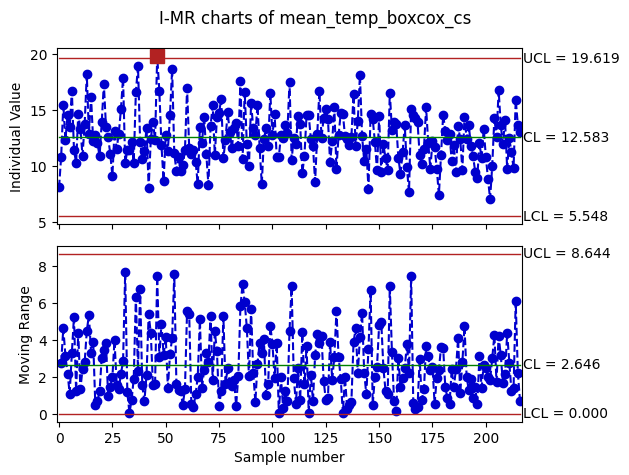

In [59]:
df_all_area_layer_means_cs = pd.DataFrame(all_area_layer_means_cs, columns=['mean_temp_boxcox_cs'])

# Control chart I-MR on the Box-Cox transformed data
_ = qda.ControlCharts.IMR(df_all_area_layer_means_cs, 'mean_temp_boxcox_cs')

It is possible to identify the area and the layer related to the out of control

In [60]:
# Identify the index of the point out of control in the I-MR chart for cold spots (all_area_layer_means_cs)
# The control limits are stored in df_all_area_layer_means_cs after running qda.ControlCharts.IMR

# Get the control limits from the I-MR chart object
ucl = df_all_area_layer_means_cs['mean_temp_boxcox_cs'].mean() + 3 * df_all_area_layer_means_cs['mean_temp_boxcox_cs'].std()
lcl = df_all_area_layer_means_cs['mean_temp_boxcox_cs'].mean() - 3 * df_all_area_layer_means_cs['mean_temp_boxcox_cs'].std()

# Find indices of points out of control
out_of_control_indices = df_all_area_layer_means_cs[
    (df_all_area_layer_means_cs['mean_temp_boxcox_cs'] > ucl) | 
    (df_all_area_layer_means_cs['mean_temp_boxcox_cs'] < lcl)
].index.tolist()

print("Indices of points out of control:", out_of_control_indices)

# Map these indices back to area_id and layer_id
area_layer_pairs = list(area_layer_mean_cs.stack().index)
out_of_control_info = []
for idx in out_of_control_indices:
    if idx < len(area_layer_pairs):
        area_id, layer_id = area_layer_pairs[idx]
        out_of_control_info.append({'index': idx, 'area_id': area_id, 'layer_id': layer_id})

print("Out of control points (index, area_id, layer_id):")
for info in out_of_control_info:
    print(info)

Indices of points out of control: [46]
Out of control points (index, area_id, layer_id):
{'index': 46, 'area_id': 2, 'layer_id': 23}


>One out of control point is found in the I-Chart. Specifically, the point comes from second area of the 23rd layer.

#### Hot Spots Analysis

Design of the I-MR Control Chart on all_area_layer_means_hs dataframe

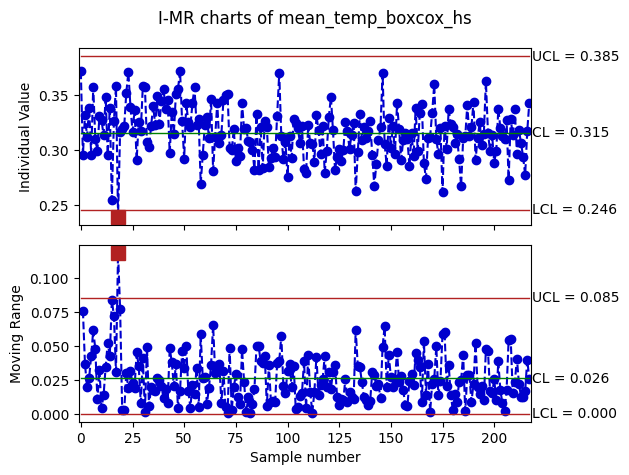

In [61]:
df_all_area_layer_means_hs = pd.DataFrame(all_area_layer_means_hs, columns=['mean_temp_boxcox_hs'])

# Control chart I-MR on the Box-Cox transformed data
_ = qda.ControlCharts.IMR(df_all_area_layer_means_hs, 'mean_temp_boxcox_hs')

It is possible to identify the area and the layer related to the out of control

In [ ]:
# Identify the index of the point out of control in the I-MR chart for hot spots (all_area_layer_means_hs)
# The control limits are stored in df_all_area_layer_means_hs after running qda.ControlCharts.IMR

# Get the control limits from the I-MR chart object
ucl = df_all_area_layer_means_hs['mean_temp_boxcox_hs'].mean() + 3 * df_all_area_layer_means_hs['mean_temp_boxcox_hs'].std()
lcl = df_all_area_layer_means_hs['mean_temp_boxcox_hs'].mean() - 3 * df_all_area_layer_means_hs['mean_temp_boxcox_hs'].std()

# Find indices of points out of control
out_of_control_indices = df_all_area_layer_means_hs[
    (df_all_area_layer_means_hs['mean_temp_boxcox_hs'] > ucl) | 
    (df_all_area_layer_means_hs['mean_temp_boxcox_hs'] < lcl)
].index.tolist()

print("Indices of points out of control:", out_of_control_indices)

# Map these indices back to area_id and layer_id
area_layer_pairs = list(area_layer_mean_hs.stack().index)
out_of_control_info = []
for idx in out_of_control_indices:
    if idx < len(area_layer_pairs):
        area_id, layer_id = area_layer_pairs[idx]
        out_of_control_info.append({'index': idx, 'area_id': area_id, 'layer_id': layer_id})

print("Out of control points (index, area_id, layer_id):")
for info in out_of_control_info:
    print(info)

Indices of points out of control: [18]
Out of control points (index, area_id, layer_id):
{'index': 18, 'area_id': 1, 'layer_id': 21}


>One out of control point is found in the I-Chart. Specifically, the point comes from the first area of the 21st layer.

### 2.1.2 Methodology for Hot & Cold Points Proximity

#### Colour Balance & Density Indicator

A p-chart is created to show the percentage of areas with potential anomalies compared to the overall number areas in a layer ($n=36$).

Runs test statistic = 0.000
Runs test p-value = 1.000



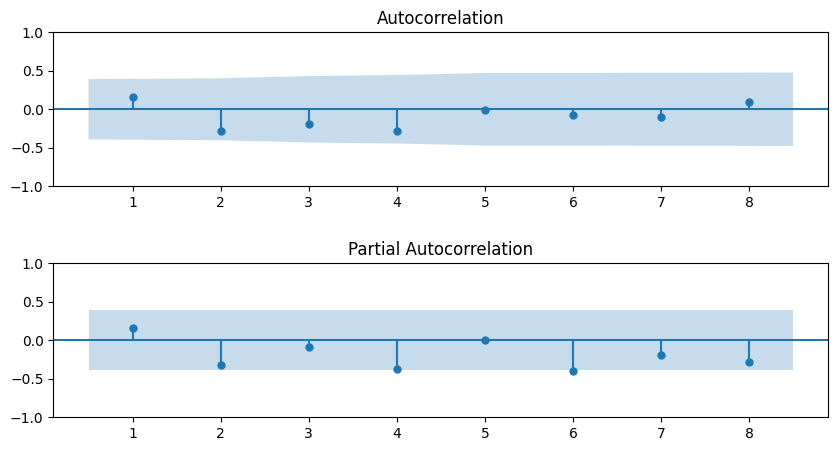

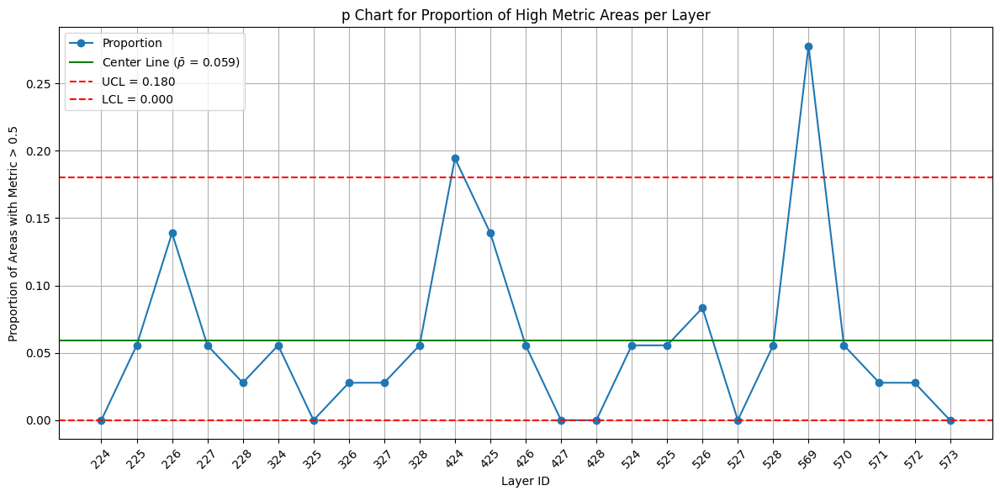

Layers with out-of-control proportions (real layer IDs):
Layer 424 (index 11) - Proportion: 0.194
Layer 569 (index 21) - Proportion: 0.278


In [62]:
from statsmodels.stats.proportion import proportion_confint

# Calculate the proportion of "successes" for each grid area (e.g., metric > threshold)
n = 36
threshold = 0.5
layer_grid_metrics['is_success'] = (layer_grid_metrics['metric'] > threshold).astype(int)

# Group by layer and calculate the proportion of successes per layer
p_chart_data = layer_grid_metrics.groupby('layer_id')['is_success'].mean()
 
_=qda.Assumptions(p_chart_data).independence()  # Controllo di indipendenza

# Calculate control limits for each layer
p_bar = p_chart_data.mean()
ucl = p_bar + 3 * np.sqrt(p_bar / n)
lcl = p_bar - 3 * np.sqrt(p_bar / n)
lcl = max(lcl, 0)  # LCL cannot be negative



plt.figure(figsize=(12, 6))
plt.plot(p_chart_data.index, p_chart_data.values, marker='o', linestyle='-', label='Proportion')
ax = plt.gca()
ax.set_xticks(p_chart_data.index)
ax.set_xticklabels([layer_ids[i - 1] for i in p_chart_data.index], rotation=45)
plt.xlabel('Real Layer ID')
plt.axhline(p_bar, color='green', linestyle='-', label=f'Center Line ($\\bar{{p}}$ = {p_bar:.3f})')
plt.axhline(ucl, color='red', linestyle='--', label=f'UCL = {ucl:.3f}')
plt.axhline(lcl, color='red', linestyle='--', label=f'LCL = {lcl:.3f}')
plt.xlabel('Layer ID')
plt.ylabel('Proportion of Areas with Metric > 0.5')
plt.title('p Chart for Proportion of High Metric Areas per Layer')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Annotate out-of-control points with their real layer IDs
out_of_control_layers = p_chart_data[(p_chart_data > ucl) | (p_chart_data < lcl)].index.tolist()
if out_of_control_layers:
    print("Layers with out-of-control proportions (real layer IDs):")
    for idx in out_of_control_layers:
        real_layer_id = layer_ids[idx - 1]  # idx is 1-based, layer_ids is sorted real IDs
        print(f"Layer {real_layer_id} (index {idx}) - Proportion: {p_chart_data.loc[idx]:.3f}")
else:
    print("No out-of-control layers found.")

> Two layers are out of control. No assignable cause is known, therefore the control limits were kept.

#### Temperature Difference Indicator

To monitor the stability and variability of the hot–cold temperature differences across spatial areas and layers, an Individuals and Moving Range (I-MR) control chart is designed. The matrix of differences is first flattened into a one-dimensional series to meet the input requirements of the control chart procedure. 

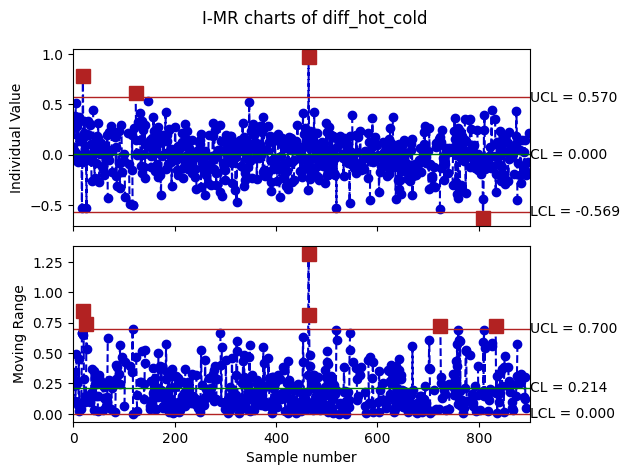

(900, 1)

In [63]:
# diff_hot_cold_per_area_layer is a DataFrame (area_id x layer_id) with the hot-cold differences
# For the I-MR chart, a "long" series of values is needed

diff_hot_cold_values = diff_hot_cold_per_area_layer.values.flatten()


df_diff_hot_cold_long = pd.DataFrame(diff_hot_cold_values, columns=['diff_hot_cold'])
_ = qda.ControlCharts.IMR(df_diff_hot_cold_long, 'diff_hot_cold')
df_diff_hot_cold_long.shape

The I-MR control chart identifies a small proportion of out-of-control points, with approximately $4/900 = 0.4\% $ of points flagged in the Individuals chart and $6/900=0.6\% $ in the Moving Range chart. These findings suggest that the majority of the hot–cold difference values remain stable, with only a limited number of observations exhibiting unusual variability or shifts.

In [64]:
# Flatten the matrix and also save the original flat position
flat_values = diff_hot_cold_per_area_layer.values.flatten()
# Find the indices of non-NaN values
not_nan_mask = ~np.isnan(flat_values)
not_nan_values = flat_values[not_nan_mask]
not_nan_indices = np.where(not_nan_mask)[0]

# Calculate the I-MR chart limits only on non-NaN values
mean = np.mean(not_nan_values)
mr = np.mean(np.abs(np.diff(not_nan_values)))
d2 = 1.128  # per n=2
UCL = mean + 3 * (mr / d2)
LCL = mean - 3 * (mr / d2)

# Find the indices of out-of-control (OOC) values in the filtered array
ooc_mask = (not_nan_values > UCL) | (not_nan_values < LCL)
ooc_flat_indices = not_nan_indices[ooc_mask]

# Retrieve area_id and layer_id for each out-of-control (OOC) value
n_areas, n_layers = diff_hot_cold_per_area_layer.shape
area_ids = diff_hot_cold_per_area_layer.index.values
layer_ids = diff_hot_cold_per_area_layer.columns.values

for idx in ooc_flat_indices:
    area_idx, layer_idx = np.unravel_index(idx, (n_areas, n_layers))
    area_id = area_ids[area_idx]
    layer_id = layer_ids[layer_idx]
    value = diff_hot_cold_per_area_layer.iloc[area_idx, layer_idx]
    print(f"Value out of control: {value:.3f} (area_id={area_id}, layer_id={layer_id})")

Value out of control: 0.776 (area_id=0, layer_id=20)
Value out of control: 0.613 (area_id=4, layer_id=24)
Value out of control: 0.965 (area_id=18, layer_id=15)
Value out of control: -0.628 (area_id=32, layer_id=9)


## 2.2 Regular Points

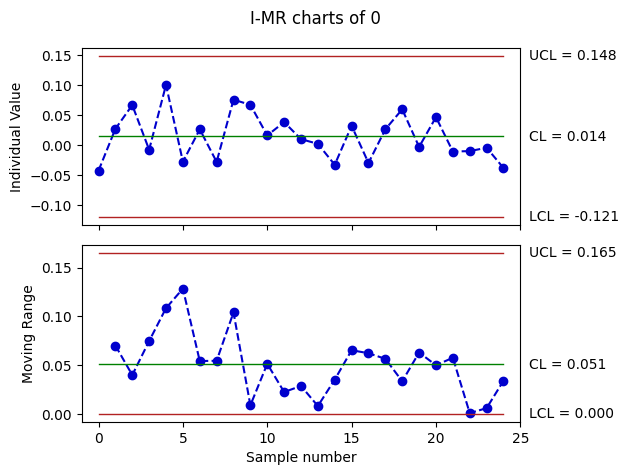

In [65]:
df_SCC_np = pd.DataFrame(regular_point_mean_per_layer, columns=['0'])

# I-MR control chart
df_SCC_IMR_np = qda.ControlCharts.IMR(df_SCC_np, '0')

>Presence of no out of control points


# References

* [1] Montgomery D. C. 2008. “Introduction to Statistical Quality Control”, John Wiley 
& Sons, pages 473-476.
* [2] [In-Process Monitoring of Selective Laser Melting: Spatial Detection of Defects Via Image Data Analysis](https://re.public.polimi.it/bitstream/11311/1016879/6/in-process%20monitoring%20of%20slm.pdf)


# PHASE 2 -----------------------------

# Preliminary data analysis

# Test of your proposed approach on new data

# Discussion